In [2]:
import tarfile
import netCDF4 as nc
from netCDF4 import Dataset
import os
import xarray as xr

# Define the path to the tar.gz file and the extraction directory
tar_gz_path = r"D:\Dom_Work\A_Work\Work\01_AIT\01_NASA's Land Information System (LIS)\example_output.tar.gz"
extraction_dir = r"D:\Dom_Work\A_Work\Work\01_AIT\01_NASA's Land Information System (LIS)"

In [3]:
# Directory containing the NetCDF files
data_surface_dir = r"D:\Dom_Work\A_Work\Work\01_AIT\01_NASA's Land Information System (LIS)\SURFACEMODEL"
data_routing_dir = r"D:\Dom_Work\A_Work\Work\01_AIT\01_NASA's Land Information System (LIS)\ROUTING"

In [4]:
# Function to recursively find all .nc files in a directory
def find_nc_files(directory):
    nc_files = []
    for root, dirs, files in os.walk(directory):
        for file in files:
            if file.endswith('.nc'):
                nc_files.append(os.path.join(root, file))
    return nc_files

In [5]:
# Find all .nc files in each directory
surface_files = find_nc_files(data_surface_dir)
routing_files = find_nc_files(data_routing_dir)

# Check if files were found
print(f'Found {len(surface_files)} files in surfacemodel')
print(f'Found {len(routing_files)} files in routing')

# Load datasets
ds_surface = xr.open_mfdataset(surface_files, combine='by_coords')
ds_routing = xr.open_mfdataset(routing_files, combine='by_coords')

Found 15339 files in surfacemodel
Found 5113 files in routing


In [6]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import cartopy.crs as ccrs
import cartopy.feature as cfeature

from scipy.stats import linregress
import scipy.stats as stats

import pymannkendall as mk

from statsmodels.tsa.seasonal import seasonal_decompose

In [7]:
# Check variables, dimensions, and attributes dataset
def check_variables(data):
    if ds_surface:
        print("Variables in SURFACEMODEL dataset:")
        print(ds_surface)  # Prints a summary of the dataset, including variables and dimensions

        print("\nList of variables in SURFACEMODEL:")
        print(list(ds_surface.data_vars))  # Lists all variables in the dataset

        # Inspect specific details of each variable
        for var in ds_surface.data_vars:
            print(f"\nDetails of variable '{var}':")
            print(ds_surface[var])  # Shows details like dimensions, attributes, etc.
    else:
        print("No SURFACEMODEL dataset loaded.")

In [204]:
# Select the variable of interest
# Compute basic statistics for a given xarray.DataArray.
def ds_variable(data, variable):
    ds = ds_surface[variable]  # Replace with  specific variable
    print(f" variable : {variable}")

    var_data = ds.load() # Load the data into memory
    print(f" shape : {var_data.shape}")
    
    ds_mean_value = var_data.mean().values # Compute basic statistics
    ds_min_value = var_data.min().values
    ds_max_value = var_data.max().values
    ds_std_dev = var_data.std().values
    print(f"Mean: {ds_mean_value:.4f} {ds.units}")
    print(f"Min: {ds_min_value:.4f} {ds.units}")
    print(f"Max: {ds_max_value:.4f} {ds.units}")
    print(f"Standard Deviation: {ds_std_dev:.4f} {ds.units}")

    return var_data

In [9]:
soil_moisture = ds_variable(ds_surface, 'SoilMoist_tavg')

 variable : SoilMoist_tavg
 shape : (5113, 4, 36, 34)
Mean: 0.2894 m^3 m-3
Min: 0.0446 m^3 m-3
Max: 0.4646 m^3 m-3
Standard Deviation: 0.0714 m^3 m-3


In [10]:
tws = ds_variable(ds_surface, 'TWS_tavg')

 variable : TWS_tavg
 shape : (5113, 36, 34)
Mean: 5490.4771 mm
Min: 5021.3496 mm
Max: 5924.2964 mm
Standard Deviation: 245.9892 mm


In [11]:
Streamflow = ds_variable(ds_surface, 'Streamflow_tavg')

 variable : Streamflow_tavg
 shape : (5113, 36, 34)
Mean: 120.7459 m3 s-1
Min: -414.8322 m3 s-1
Max: 21396.9824 m3 s-1
Standard Deviation: 646.3803 m3 s-1


In [242]:
def correlation_df (data, var_sm, var_tws, var_streamflow):
    # Flatten the spatial dimensions (north_south, east_west) and align time
    soil_moisture_f = data[var_sm].mean(dim=['SoilMoist_profiles', 'north_south', 'east_west']).values
    tws_f = data[var_tws].mean(dim=['north_south', 'east_west']).values
    streamflow_f = data[var_streamflow].mean(dim=['north_south', 'east_west']).values

    # Ensure all arrays have the same length along the time dimension
    print(f"Soil Moisture Shape: {soil_moisture_f.shape}")
    print(f"TWS Shape: {tws_f.shape}")
    print(f"Streamflow Shape: {streamflow_f.shape}")

    # Concatenate variables for correlation calculation
    df = np.column_stack([soil_moisture_f.flatten(), tws_f, streamflow_f])
    
    # Compute correlation matrix
    corr_matrix = np.corrcoef(df, rowvar=False)

    # Plot Visualize the correlation matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(corr_matrix, annot=True, xticklabels=[var_sm, var_tws, var_streamflow],
                yticklabels=[var_sm, var_tws, var_streamflow], cmap='coolwarm', center=0, vmin=0, vmax=1)
    plt.title('Correlation between Soil Moisture, TWS, and Streamflow')
    plt.show()

    return df

Soil Moisture Shape: (5113,)
TWS Shape: (5113,)
Streamflow Shape: (5113,)


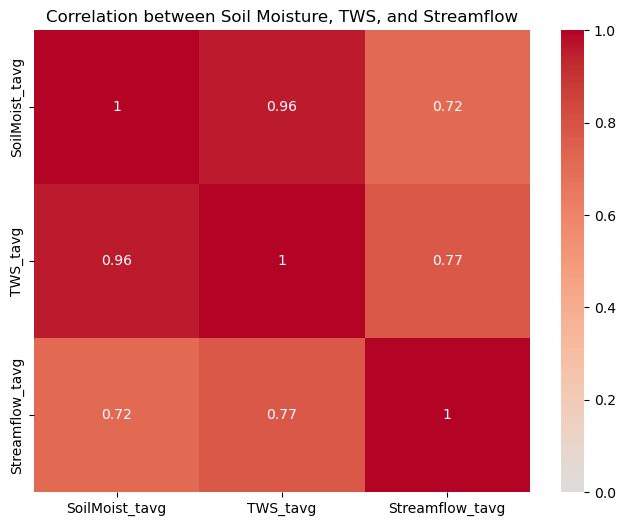

array([[1.9990526e-01, 5.2994395e+03, 1.0439131e-02],
       [1.9992106e-01, 5.2985586e+03, 9.5153101e-02],
       [1.9951537e-01, 5.2975171e+03, 1.2372973e-02],
       ...,
       [2.5849330e-01, 5.4494639e+03, 5.3947830e+00],
       [2.5761533e-01, 5.4471187e+03, 5.0766349e+00],
       [2.5667763e-01, 5.4447832e+03, 4.0489745e+00]], dtype=float32)

In [244]:
correlation_df (ds_surface, 'SoilMoist_tavg', 'TWS_tavg', 'Streamflow_tavg')

In [ ]:
#Positive Correlation (0 to 1): A positive value indicates that as one variable increases, the other tends to increase as well.
#Negative Correlation (-1 to 0): A negative value means that as one variable increases, the other tends to decrease.
#Zero Correlation (~0): No linear relationship between the variables.

In [252]:
def compute_and_plot_correlations(data, var_sm, var_tws, var_streamflow):
    """
    Computes correlations among variables (Soil Moisture, TWS, Streamflow) for each grid cell 
    Parameters:
        ds (xarray.Dataset): Input dataset containing SoilMoist_tavg, TWS_tavg, and Streamflow_tavg.
    """
    
    # Step 1: Clean the dataset by replacing missing values with NaN
    data = data.where(data != data.attrs.get('missing_value', np.nan))
    
    # Step 2: Ensure all data variables are finite (no NaNs, infinities)
    data = data.map(lambda x: x.where(np.isfinite(x), np.nan))
    
    # Step 3: Define a helper function to safely compute correlation
    def safe_correlation(var_sm, var_tws):
        # Force computation to handle invalid values before correlation
        var_sm = var_sm.compute()
        var_tws = var_tws.compute()
        
        # Mask valid data
        valid_mask = np.isfinite(var_sm) & np.isfinite(var_tws)
        var_sm = var_sm.where(valid_mask, drop=True)
        var_tws = var_tws.where(valid_mask, drop=True)
        
        # Return correlation result
        return xr.corr(var_sm, var_tws, dim='time')
    
    # Step 4: Compute correlations for each combination of variables
    correlation_sm_tws = safe_correlation(data[var_sm].mean(dim='SoilMoist_profiles'), data[var_tws])
    correlation_sm_stream = safe_correlation(data[var_sm].mean(dim='SoilMoist_profiles'), data[var_streamflow])
    correlation_tws_stream = safe_correlation(data[var_tws], data[var_streamflow])
    
    # Step 5: Plot the correlations
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    # Plot each correlation with appropriate colormap
    correlation_sm_tws.plot(ax=axes[0], cmap='coolwarm', vmin=-1, vmax=1)
    axes[0].set_title(f'Correlation: {var_sm} & {var_tws}')

    correlation_sm_stream.plot(ax=axes[1], cmap='coolwarm', vmin=-1, vmax=1)
    axes[1].set_title(f'Correlation: {var_sm} & {var_streamflow}')

    correlation_tws_stream.plot(ax=axes[2], cmap='coolwarm', vmin=-1, vmax=1)
    axes[2].set_title(f'Correlation: {var_tws} & {var_streamflow}')

    plt.tight_layout()
    plt.show()

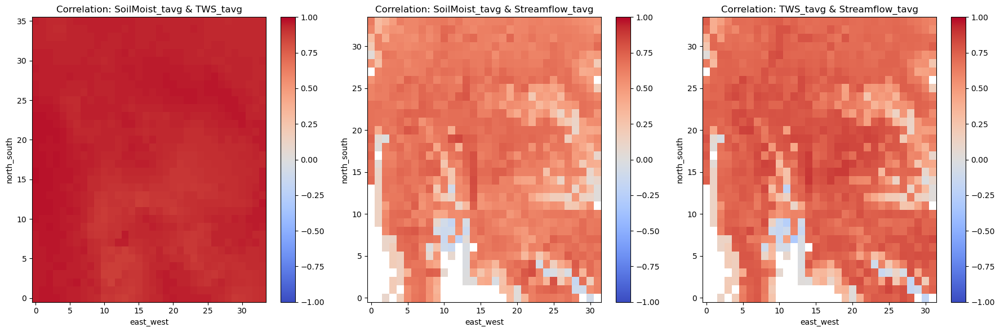

In [254]:
# Example usage:
compute_and_plot_correlations(ds_surface, 'SoilMoist_tavg', 'TWS_tavg', 'Streamflow_tavg')

In [258]:
def compute_and_plot_scatter(data, var_sm, var_tws, var_streamflow):
    """
    Computes scatter plots among variables (Soil Moisture, TWS, Streamflow) for each grid cell 
    Parameters:
        ds (xarray.Dataset): Input dataset containing SoilMoist_tavg, TWS_tavg, and Streamflow_tavg.
    """
    
    # Step 1: Clean the dataset by replacing missing values with NaN
    data = data.where(data != data.attrs.get('missing_value', np.nan))
    
    # Step 2: Ensure all data variables are finite (no NaNs, infinities)
    data = data.map(lambda x: x.where(np.isfinite(x), np.nan))
    
    # Extract variables for scatter plots
    v_sm = data[var_sm].mean(dim='SoilMoist_profiles')
    v_tws = data[var_tws]
    v_stream = data[var_streamflow]
    
    # Flatten the data for scatter plots (ignoring spatial dimensions)
    def flatten_data(da):
        """Helper function to flatten data arrays for scatter plots."""
        return da.stack(grid=['north_south', 'east_west']).values.flatten()
    
    sm_flat = flatten_data(v_sm)
    tws_flat = flatten_data(v_tws)
    stream_flat = flatten_data(v_stream)
    
    # Step 3: Plot scatter plots for each pair
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    
    # Scatter plot: Soil Moisture vs. TWS
    axes[0].scatter(sm_flat, tws_flat, alpha=0.5, c='blue')
    axes[0].set_xlabel(f' {var_sm} (avg)')
    axes[0].set_ylabel(f' {var_tws}')
    axes[0].set_title(f'Scatter Plot: {var_sm} vs. {var_tws}')
    
    # Scatter plot: Soil Moisture vs. Streamflow
    axes[1].scatter(sm_flat, stream_flat, alpha=0.5, c='green')
    axes[1].set_xlabel(f' {var_sm} (avg)')
    axes[1].set_ylabel(f' {var_streamflow}')
    axes[1].set_title(f'Scatter Plot: {var_sm} vs. {var_streamflow}')
    
    # Scatter plot: TWS vs. Streamflow
    axes[2].scatter(tws_flat, stream_flat, alpha=0.5, c='red')
    axes[2].set_xlabel(f' {var_tws}')
    axes[2].set_ylabel(f' {var_streamflow}')
    axes[2].set_title(f'Scatter Plot: {var_tws} vs. {var_streamflow}')
    
    plt.tight_layout()
    plt.show()

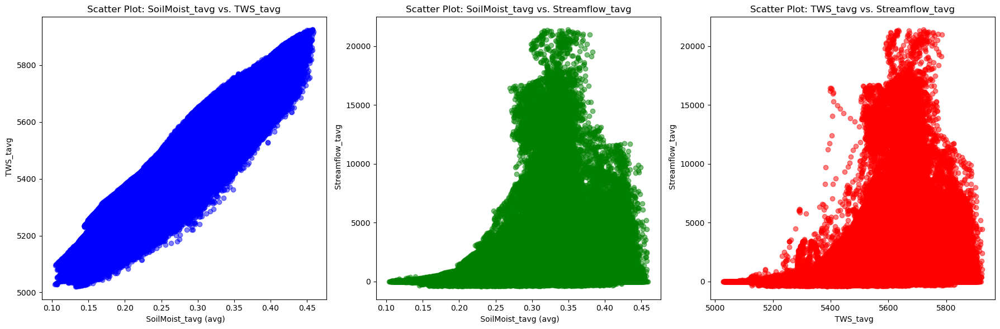

In [260]:
# Example usage:
compute_and_plot_scatter(ds_surface, 'SoilMoist_tavg', 'TWS_tavg', 'Streamflow_tavg')

In [264]:
# Define a function to compute time-lagged correlations
def compute_time_lagged_correlation(var_1, var_2, max_lag):
    """
    Compute time-lagged correlations between two variables.
    :param variable1: First time series (e.g., soil moisture).
    :param variable2: Second time series (e.g., streamflow).
    :param max_lag: Maximum time lag to compute (in days).
    :return: Dictionary with lags and corresponding correlations.
    """
    correlations = {}
    for lag in range(-max_lag, max_lag + 1):
        # Shift the first variable by the lag (negative = lag behind, positive = lead)
        shifted_var1 = np.roll(var_1, lag)
        
        # Calculate correlation at this lag
        correlation = np.corrcoef(shifted_var1, var_2)[0, 1]
        correlations[lag] = correlation
    
    return correlations

In [272]:
# Flatten the spatial dimensions (north_south, east_west) and align time
soil_moisture_f = ds_surface['SoilMoist_tavg'].mean(dim=['SoilMoist_profiles', 'north_south', 'east_west']).values
tws_f = ds_surface["TWS_tavg"].mean(dim=['north_south', 'east_west']).values
streamflow_f = ds_surface["Streamflow_tavg"].mean(dim=['north_south', 'east_west']).values

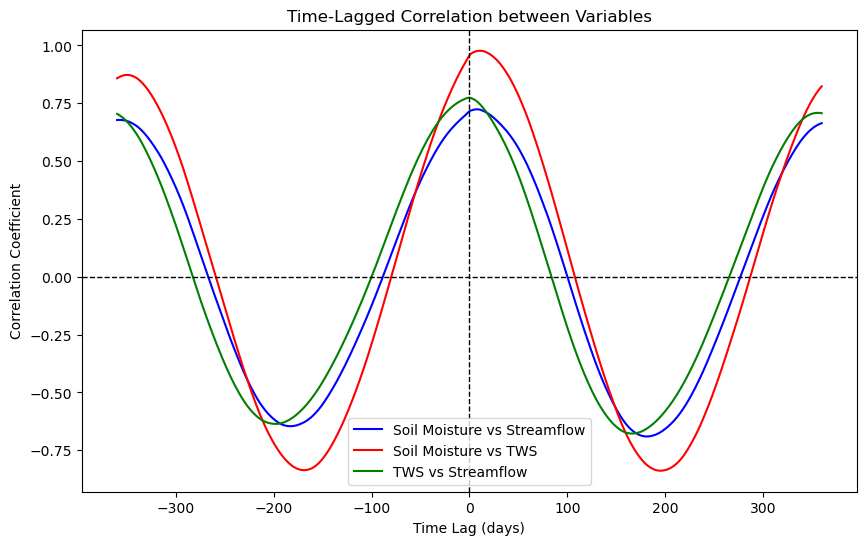

In [282]:
# Define the maximum lag (days before and after)
max_lag = 360

# Compute time-lagged correlations
lagged_corr_soil_stream = compute_time_lagged_correlation(soil_moisture_f, streamflow_f, max_lag)
lagged_corr_soil_tws = compute_time_lagged_correlation(soil_moisture_f, tws_f, max_lag)
lagged_corr_tws_stream = compute_time_lagged_correlation(tws_f, streamflow_f, max_lag)

# Plot the time-lagged correlations
plt.figure(figsize=(10, 6))
plt.plot(list(lagged_corr_soil_stream.keys()), list(lagged_corr_soil_stream.values()), label='Soil Moisture vs Streamflow', color='blue')
plt.plot(list(lagged_corr_soil_stream.keys()), list(lagged_corr_soil_tws.values()), label='Soil Moisture vs TWS', color='red')
plt.plot(list(lagged_corr_tws_stream.keys()), list(lagged_corr_tws_stream.values()), label='TWS vs Streamflow', color='green')
plt.axhline(0, color='black', linestyle='--', linewidth=1)
plt.axvline(0, color='black', linestyle='--', linewidth=1)
plt.xlabel('Time Lag (days)')
plt.ylabel('Correlation Coefficient')
plt.title('Time-Lagged Correlation between Variables')
plt.legend()
plt.show()

In [ ]:
#Interpretation of Time-Lagged Correlations
#Positive Lag : If the correlation is strongest at a positive lag, it suggests that changes in the first variable (soil moisture) 
#lead changes in the second variable (streamflow) after the corresponding number of days.

#Negative Lag : If the correlation peaks at a negative lag, it implies that the second variable leads the first one by that time period.

#Lag 0: A strong correlation at zero lag suggests that the two variables change simultaneously (without a temporal delay), 
#often reflecting direct influences or shared seasonal patterns.

In [19]:
def plot_time_series(data, variable, spatial_dims=['north_south', 'east_west']):
    # Check if the variable exists in the dataset
    if variable in data.data_vars:
        # Access the variable and calculate the mean over spatial dimensions
        var_data = data[variable].mean(dim=spatial_dims)
        units = var_data.attrs.get('units', '')  # Retrieve units if available

        # Plot the time series
        plt.figure(figsize=(12, 6))
        var_data.plot()  # Plot the DataArray directly
        plt.title(f'Time Series of {variable}')
        plt.xlabel('Time')
        plt.ylabel(f'{variable} ({units})')
        plt.grid()
        plt.show()
    else:
        print(f"Variable '{variable}' not found in the dataset.")

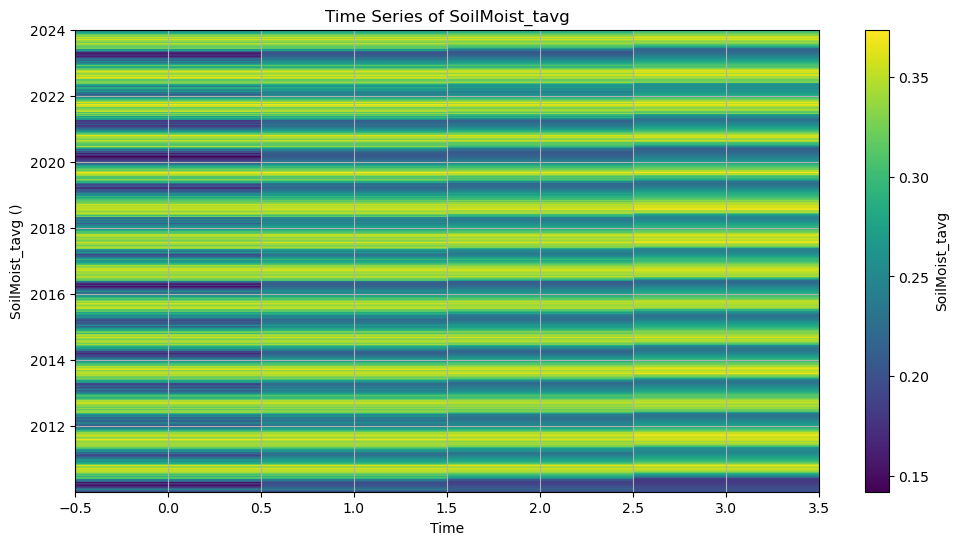

In [20]:
# Example usage:
if ds_surface:
    plot_time_series(ds_surface, 'SoilMoist_tavg')

In [21]:
def plot_all_variables(data, spatial_dims=['north_south', 'east_west']):
    # Number of variables to plot
    num_vars = len(data.data_vars)

    # Create subplots with the number of rows equal to the number of variables
    fig, axes = plt.subplots(num_vars, 1, figsize=(14, 4 * num_vars), constrained_layout=True)
    
    # If there's only one variable, ensure axes is a list for consistent iteration
    if num_vars == 1:
        axes = [axes]

    # Iterate over each variable in the dataset
    for ax, (variable_name, variable_data) in zip(axes, data.data_vars.items()):
        # Calculate the mean over the specified spatial dimensions
        mean_data = variable_data.mean(dim=spatial_dims)
        units = variable_data.attrs.get('units', '')  # Retrieve units if available

        # Plot the time series for each variable
        mean_data.plot(ax=ax)
        ax.set_title(f'Time Series of {variable_name}')
        ax.set_xlabel('Time')
        ax.set_ylabel(f'{variable_name} ({units})')
        ax.grid()

    # Display the plot
    plt.show()

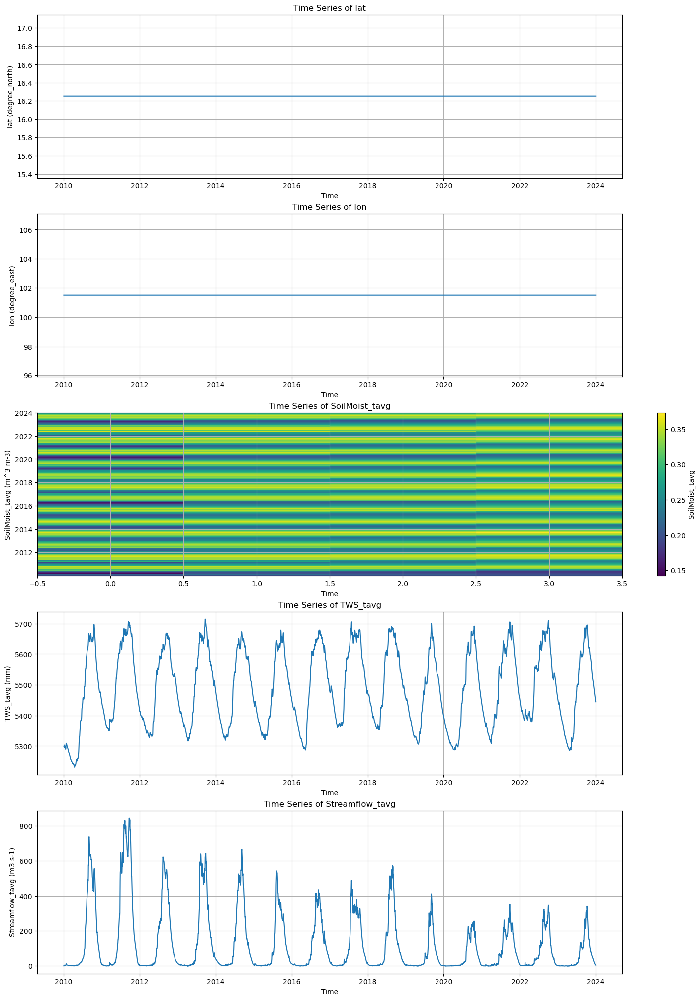

In [22]:
# Example usage:
if ds_surface:
    plot_all_variables(ds_surface)

In [23]:
def plot_variable_statistics(data, variable, spatial_dims=['north_south', 'east_west']):
    # Check if the variable exists in the dataset
    if variable in data.data_vars:
        # Access the variable data
        var_data = data[variable]

        # Calculate statistics over the specified spatial dimensions
        var_mean = var_data.mean(dim=spatial_dims)
        var_min = var_data.min(dim=spatial_dims)
        var_max = var_data.max(dim=spatial_dims)
        var_std_dev = var_data.std(dim=spatial_dims)
        units = var_data.attrs.get('units', '')  # Retrieve units if available

        # Create the plot
        plt.figure(figsize=(12, 6))
        plt.plot(var_mean, label=f'Average {variable} (TWS)')
        plt.plot(var_min, label=f'Minimum {variable} (TWS)', linestyle='--')
        plt.plot(var_max, label=f'Maximum {variable} (TWS)', linestyle='--')

        # Customize the plot
        plt.title(f'Average, Minimum, and Maximum {variable} Over Time')
        plt.xlabel('Time')
        plt.ylabel(f'{variable} ({units})')
        plt.legend(loc='lower right')
        plt.grid(True)
        plt.tight_layout()

        # Show the plot
        plt.show()
    else:
        print(f"Variable '{variable}' not found in the dataset.")

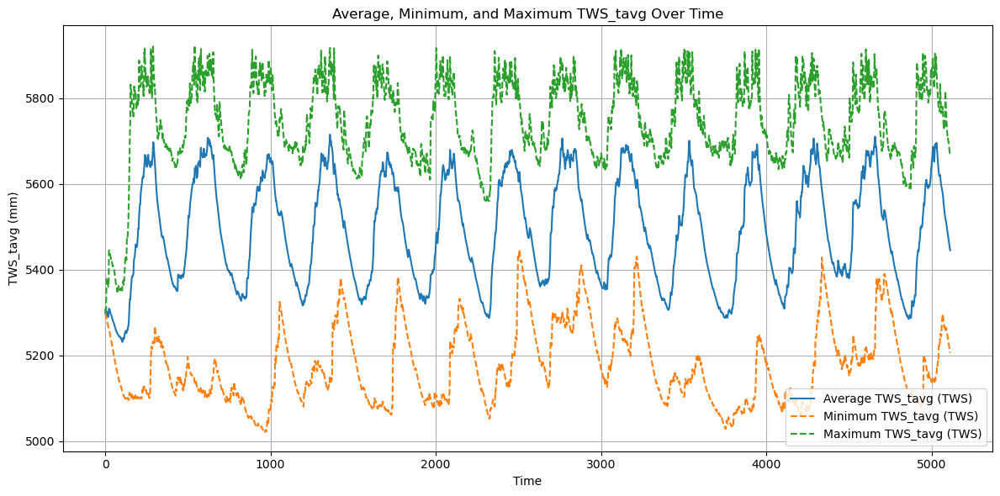

In [24]:
# Example usage:
if ds_surface:
    plot_variable_statistics(ds_surface, 'TWS_tavg')

In [25]:
def decompose_and_plot(data, variable, spatial_dims=['north_south', 'east_west'], model='additive', freq=None):
    """
    Decomposes and plots the time series of a specified variable into trend, seasonal, and residual components.

    Args:
        data (xarray.Dataset): The dataset containing the variable.
        variable (str): The name of the variable to decompose and plot.
        spatial_dims (list): List of spatial dimensions to average over (default: ['north_south', 'east_west']).
        model (str): The decomposition model ('additive' or 'multiplicative'). Default is 'additive'.
        freq (int): Frequency of the seasonal decomposition. If None, it's inferred from the data.

    Returns:
        None
    """
    # Check if the variable exists in the dataset
    if variable in data.data_vars:
        # Calculate the mean over the spatial dimensions to get the overall time series
        var_mean = data[variable].mean(dim=spatial_dims).to_pandas()

        # Perform seasonal decomposition
        decomposition = seasonal_decompose(var_mean, model=model, period=freq)

        # Create subplots
        fig, axs = plt.subplots(4, 1, figsize=(12, 10), sharex=True)

        # Plot the original time series
        axs[0].plot(var_mean.index, var_mean.values, label='Original', color='blue')
        axs[0].set_title('Original Time Series')
        axs[0].legend(loc='lower right')
        axs[0].grid(True)

        # Plot the trend component
        axs[1].plot(decomposition.trend.index, decomposition.trend.values, label='Trend', color='red')
        axs[1].set_title('Trend Component')
        axs[1].legend(loc='lower right')
        axs[1].grid(True)

        # Plot the seasonal component
        axs[2].plot(decomposition.seasonal.index, decomposition.seasonal.values, label='Seasonal', color='green')
        axs[2].set_title('Seasonal Component')
        axs[2].legend(loc='lower right')
        axs[2].grid(True)

        # Plot the residual component
        axs[3].plot(decomposition.resid.index, decomposition.resid.values, label='Residual', color='gray')
        axs[3].set_title('Residual Component')
        axs[3].legend(loc='lower right')
        axs[3].grid(True)

        # Set x-axis label for all subplots
        for ax in axs:
            ax.set_xlabel('Time')

        # Adjust layout and add a main title
        plt.tight_layout()
        plt.suptitle(f'Seasonal Decomposition of {variable} Time Series', fontsize=16, y=1.02)
        plt.show()

    else:
        print(f"Variable '{variable}' not found in the dataset.")

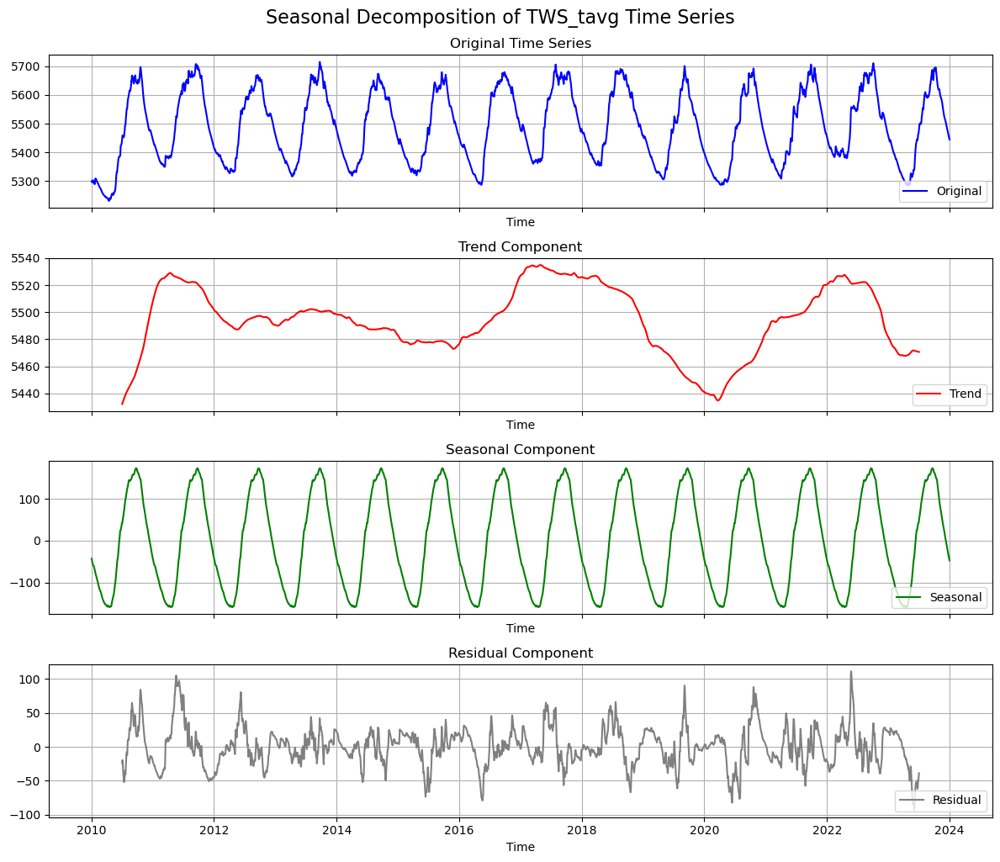

In [26]:
# Example usage:
if ds_surface:
    decompose_and_plot(ds_surface, 'TWS_tavg', model='additive', freq=365)

In [27]:
#Summary
#Trend Component: Use to analyze long-term changes and overall direction.
#Seasonal Component: Identify recurring patterns and plan accordingly.
#Residual Component: Detect anomalies or noise.
#Modeling and Forecasting: Use decomposed components to improve model performance.
#Decision Support: Apply insights to make informed decisions in relevant sectors.
#Understanding these components helps in gaining deeper insights into data and improving analysis and forecasting accuracy. 

In [28]:
# Extract latitude, longitude, and soil moisture values from ds_surface
latitude = ds_surface['lat'].values
longitude = ds_surface['lon'].values

In [29]:
soil_moisture_avg = soil_moisture.mean(dim=['north_south', 'east_west'])  # Average over spatial dimensions
print(soil_moisture_avg.shape)

(5113, 4)


In [30]:
soil_moisture_mean = ds_surface['SoilMoist_tavg'].mean(axis=0).values  # Average over all layers
print(soil_moisture_mean.shape)

(4, 36, 34)


In [31]:
# Plotting example: Time series plot for a specific location
tws_mean = tws.mean(dim=['north_south', 'east_west'])
print(tws_mean.shape)

(5113,)


In [32]:
# Number of layers
num_layers = soil_moisture.shape[1]
print(num_layers)

4


In [33]:
def plot_soil_moisture_layers(soil_moisture_data, latitude, longitude, num_layers, cmap='viridis'):
    """
    Plots soil moisture profiles in subplots.

    Parameters:
    - soil_moisture_data: 3D array (layers, lat, lon) of soil moisture values.
    - latitude: 1D array of latitude values.
    - longitude: 1D array of longitude values.
    - num_layers: Number of layers to plot.
    - cmap: Colormap for the plots (default is 'viridis').
    """
    # Create subplots
    fig, axes = plt.subplots(nrows=1, ncols=num_layers, figsize=(15, 4), sharex=True, sharey=True)
    fig.subplots_adjust(hspace=0.5, wspace=0.3)

    # Plot each layer
    for layer_idx in range(num_layers):
        ax = axes[layer_idx]
        layer_soil_moisture = soil_moisture_data[layer_idx, :, :]
        
        # Plot the layer with the provided colormap
        cax = ax.imshow(layer_soil_moisture, extent=(longitude.min(), longitude.max(), latitude.min(), latitude.max()), 
                        cmap=cmap, origin='lower')
        ax.set_title(f'Soil Moisture Profile {layer_idx + 1}')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
    
    # Add a colorbar to the figure
    fig.colorbar(cax, ax=axes, label='Soil Moisture (m3/m3)')

    # Display the plots
    plt.show()

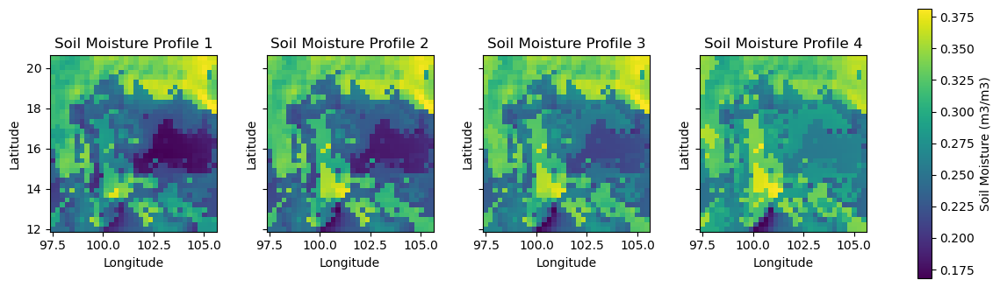

In [34]:
# Call the function to plot the layers
plot_soil_moisture_layers(soil_moisture_mean, latitude, longitude, num_layers)

In [35]:
from dask.diagnostics import ProgressBar

# Optimize chunking strategy
ds_surface_chunk = ds_surface.chunk({'time': 100, 'north_south': 18, 'east_west': 17, 'SoilMoist_profiles': 4})

In [36]:
# Define the number of layers (SoilMoist_profiles)
num_layers = soil_moisture.sizes['SoilMoist_profiles']

In [37]:
def compute_ssi_optimized(data, time):
    """
    Computes the Standardized Soil Moisture Index (SSI) with Dask optimizations.
    """
    # Resample data with Dask's parallel processing
    resampled_sm = data.resample(time=time).mean(dim='time', skipna=True)

    # Calculate mean and std over time with Dask, avoiding lazy evaluations
    sm_mean = resampled_sm.mean(dim='time')
    sm_std = resampled_sm.std(dim='time')
    standardized_sm = (resampled_sm - sm_mean) / sm_std

    # Fit a normal distribution using CDF and convert to SSI using PPF
    ssi = xr.apply_ufunc(
        stats.norm.cdf,
        standardized_sm,
        vectorize=True,
        dask='parallelized',
        output_dtypes=[float]
    )

    ssi = xr.apply_ufunc(
        stats.norm.ppf,
        ssi,
        vectorize=True,
        dask='parallelized',
        output_dtypes=[float]
    )
    
    # Persist intermediate results in memory to avoid repeated computation
    ssi = ssi.persist()
    
    return ssi

In [38]:
def plot_ssi(ssi, time_index=-1, cmap='RdBu', vmin=-3, vmax=3):
    
    # Select the specified time step and compute if necessary
    ssi_selected = ssi.isel(time=time_index).compute()
    
    # Plotting
    plt.figure(figsize=(10, 6))
    cax = plt.imshow(ssi_selected, cmap=cmap, vmin=vmin, vmax=vmax, origin='lower')
    plt.title(f'Standardized Soil Moisture Index (SSI) - Time Step {time_index}')
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.colorbar(cax, label='SSI Value')
    plt.show()

In [39]:
# Use progress bar to track Dask computations
with ProgressBar():
    soil_moisture = ds_surface_chunk['SoilMoist_tavg']
    ssi_yearly = compute_ssi_optimized(soil_moisture.isel(SoilMoist_profiles=0),'1YE'  )
print(ssi_yearly.shape)

[########################################] | 100% Completed | 4.57 sms
(15, 36, 34)


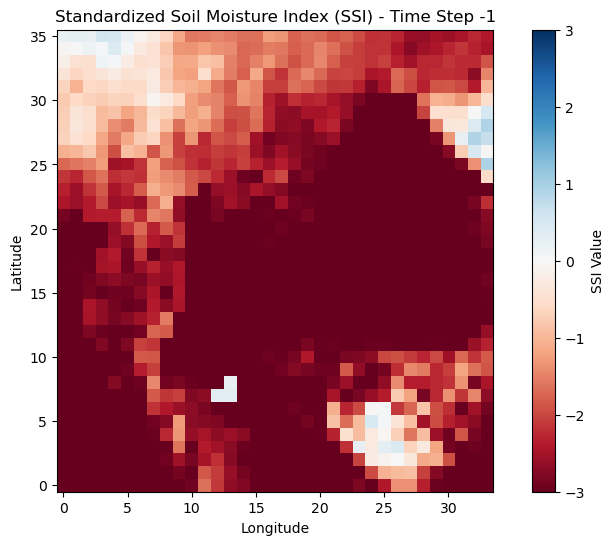

In [40]:
# Example usage with the latest time step
plot_ssi(ssi_yearly)  # Plots the latest time step by default

In [41]:
# Combine soil moisture profiles by averaging across the 'SoilMoist_profiles' dimension
combined_soil_moisture = ds_surface['SoilMoist_tavg'].mean(dim='SoilMoist_profiles')
print(combined_soil_moisture.shape)

(5113, 36, 34)


In [42]:
# Use progress bar to track Dask computations
with ProgressBar():
    soil_moisture = ds_surface_chunk['SoilMoist_tavg']
    ssi_combined_yearly = compute_ssi_optimized(combined_soil_moisture, '1YE'  )
print(ssi_combined_yearly.shape)

(15, 36, 34)


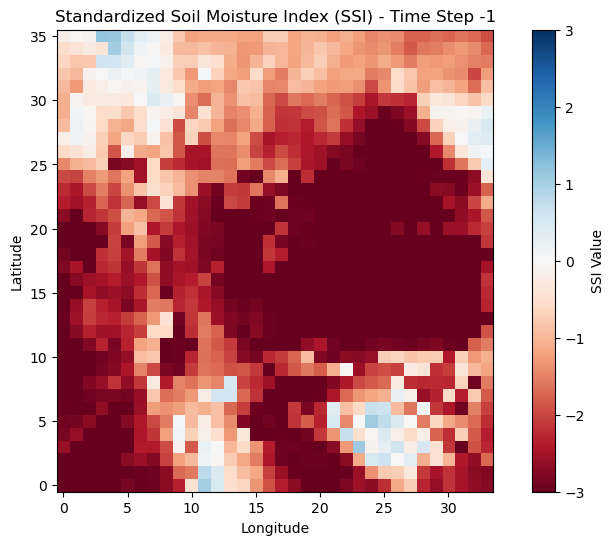

In [43]:
# Plotting SSI for the latest time step
plot_ssi(ssi_combined_yearly)

In [44]:
def plot_sm_subplots(data, data_name, latitudes, longitudes, vmin, vmax, cols=5 ):
    """
    Automate plotting of SSI data across multiple time steps using Cartopy projections.

    Parameters:
    - ssi_data: xarray.DataArray containing SSI values (time, north_south, east_west).
    - latitudes: Array of latitude values corresponding to the data.
    - longitudes: Array of longitude values corresponding to the data.
    - cols: Number of columns in the subplot grid.

    Returns:
    - None. Displays the plot with SSI data for each time step.
    """
    # Determine the number of time steps
    n_time_steps = len(data.time)
    
    # Calculate rows needed based on the number of columns
    rows = int(np.ceil(n_time_steps / cols))
    
    # Create the figure and set of subplots
    fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(22, rows * 4),
                             subplot_kw={'projection': ccrs.PlateCarree()})
    axes = axes.flatten()  # Flatten the array of axes for easy indexing

    # Loop over each time step to plot  values
    for i, ax in enumerate(axes[:n_time_steps]):
        # Extract SSI data for the current time step
        ssi_frame = data.isel(time=i).values
        
        # Plot the  data
        img = ax.imshow(
            ssi_frame, extent=[longitudes.min(), longitudes.max(), latitudes.min(), latitudes.max()],
            transform=ccrs.PlateCarree(), cmap='RdBu', vmin=vmin, vmax=vmax, origin='lower'
        )
        
        # Add map features
        ax.coastlines()
        ax.add_feature(cfeature.BORDERS, linestyle=':')
        ax.set_title(f'{data_name} - Time: {str(data.time[i].values)[:10]}')

    # Remove any remaining empty axes
    for ax in axes[n_time_steps:]:
        fig.delaxes(ax)

    # Create a dedicated axis for the colorbar outside the plot grid
    cbar_ax = fig.add_axes([0.02, 0.1, 0.02, 0.8])  # [left, bottom, width, height]
    cbar = fig.colorbar(img, cax=cbar_ax) #orientation='horizontal')
    cbar.set_label(f'{data_name} Value')

    # Adjust subplot spacing
    plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05, wspace=0.1, hspace=0.2)

    # Display the plots
    plt.show()

In [45]:
# Select the time dimension for visualization
time_steps = ssi_combined_yearly.time
print(time_steps.shape)
latitude.shape

(15,)


(5113, 36, 34)

In [46]:
# Example usage:
lat = ds_surface['lat'].isel(time=0).values[:, 0]
lon = ds_surface['lon'].isel(time=0).values[0, :]
print(lat.shape)

(36,)


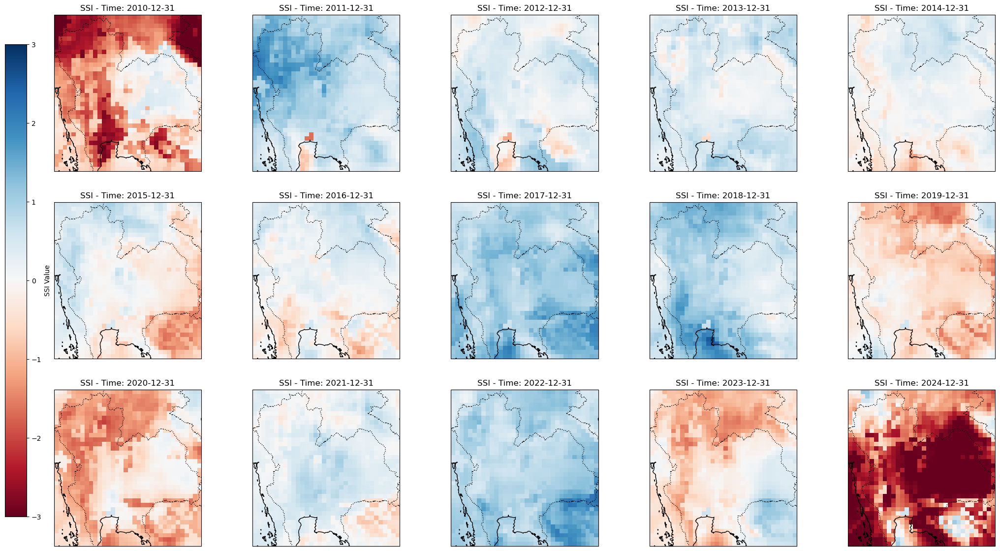

In [47]:
# Call the function to plot the SSI data
#plot_ssi_subplots(ssi_combined_yearly, lat, lon)
plot_sm_subplots(ssi_combined_yearly, 'SSI' , lat, lon, vmin = -3 , vmax = 3 , cols=5 )

(169, 36, 34)


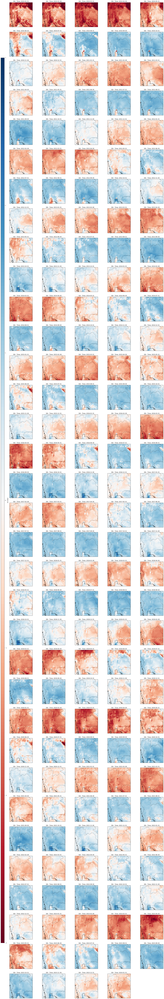

In [48]:
with ProgressBar():
    soil_moisture = ds_surface_chunk['SoilMoist_tavg']
    ssi_combined_monthly = compute_ssi_optimized(combined_soil_moisture, '1ME'  )
print(ssi_combined_monthly.shape)

# Call the function to plot the SSI data
plot_sm_subplots(ssi_combined_monthly, 'SSI' , lat, lon, vmin = -3 , vmax = 3 , cols=5 )

In [49]:
#	SSI > 2: Extremely wet conditions.
#	SSI between 1 and 2: Moderately wet conditions.
#	SSI between 0 and 1: Slightly wetter than average.
#	SSI between -1 and 0: Slightly drier than average.
#	SSI between -2 and -1: Moderately dry conditions, which could indicate early signs of drought.
#	SSI < -2: Extremely dry conditions, indicative of severe drought.

In [50]:
ssi_values = ssi_combined_yearly.values  
print(f"SSI Data Shape: {ssi_values.shape}")  # Expecting (time, lat, lon)

SSI Data Shape: (15, 36, 34)


In [51]:
import pycwt as wavelet

def cross_wavelet(data, selected_lat, selected_lon, name):
    """
    Compute and plot the Continuous Wavelet Transform (CWT) of the given data.

    Parameters:
    - data: 3D numpy array (time, latitude, longitude) or xarray.DataArray
    - selected_lat: Latitude index for which to plot the CWT
    - selected_lon: Longitude index for which to plot the CWT
    - name: Name of the variable (for plot title)
    
    Returns:
    - cwt_powers: 4D numpy array of wavelet powers (latitude, longitude, frequency, time)
    """
    # Convert xarray.DataArray to numpy array if needed
    if isinstance(data, np.ndarray):
        data_array = data
    elif hasattr(data, 'values'):
        data_array = data.values
    else:
        raise TypeError("Input data must be a numpy array or xarray.DataArray.")

    # Time parameters
    dt = 1  # Daily time steps
    time = np.arange(data_array.shape[0])  # Time indices
    mother = wavelet.Morlet()  # Morlet wavelet
    dj = 0.25  # Scale resolution
    s0 = 2 * dt  # Smallest scale in days
    J = 7 / dj  # Number of scales

    # Initialize lists to store CWT power for each grid point
    cwt_powers = np.empty((data_array.shape[1], data_array.shape[2], 0, 0))  # Initialize empty array

    # Loop through each grid point (latitude, longitude)
    for lat_idx in range(data_array.shape[1]):  # 36 latitudes
        for lon_idx in range(data_array.shape[2]):  # 34 longitudes
            # Extract the time series for the current grid point
            data_timeseries = data_array[:, lat_idx, lon_idx]

            # Check if the time series has enough length
            if len(data_timeseries) < s0:
                print(f"Warning: Time series at ({lat_idx}, {lon_idx}) is too short.")
                continue

            # Perform Continuous Wavelet Transform (CWT)
            try:
                wave, scales, freqs, coi, _, _ = wavelet.cwt(data_timeseries, dt, dj=dj, s0=s0, J=J, wavelet=mother)
                # Calculate the power of the wavelet transform
                power = np.abs(wave) ** 2  # Power of the wavelet (2D: frequency x time)

                # Append power to the list
                if cwt_powers.size == 0:
                    cwt_powers = np.empty((data_array.shape[1], data_array.shape[2], len(freqs), len(time)))

                cwt_powers[lat_idx, lon_idx, :, :] = power

            except Exception as e:
                print(f"Error processing data at ({lat_idx}, {lon_idx}): {e}")

    # Plotting for the selected latitude and longitude
    plt.figure(figsize=(14, 8))
    plt.contourf(time, freqs, cwt_powers[selected_lat, selected_lon, :, :], levels=100, cmap='RdBu', extend='both')
    plt.colorbar(label='Wavelet Power')
    plt.title(f'CWT of {name} at Grid Point ({selected_lat}, {selected_lon})')
    plt.xlabel('Time')
    plt.ylabel('Frequency (1/Time Units)')
    plt.yscale('log')
    plt.axhline(1 / 12, color='k', linestyle='--', label='Annual Period')
    plt.axhline(1 / 6, color='k', linestyle='--', label='Semi-Annual Period')
    plt.legend()
    plt.show()

    return cwt_powers

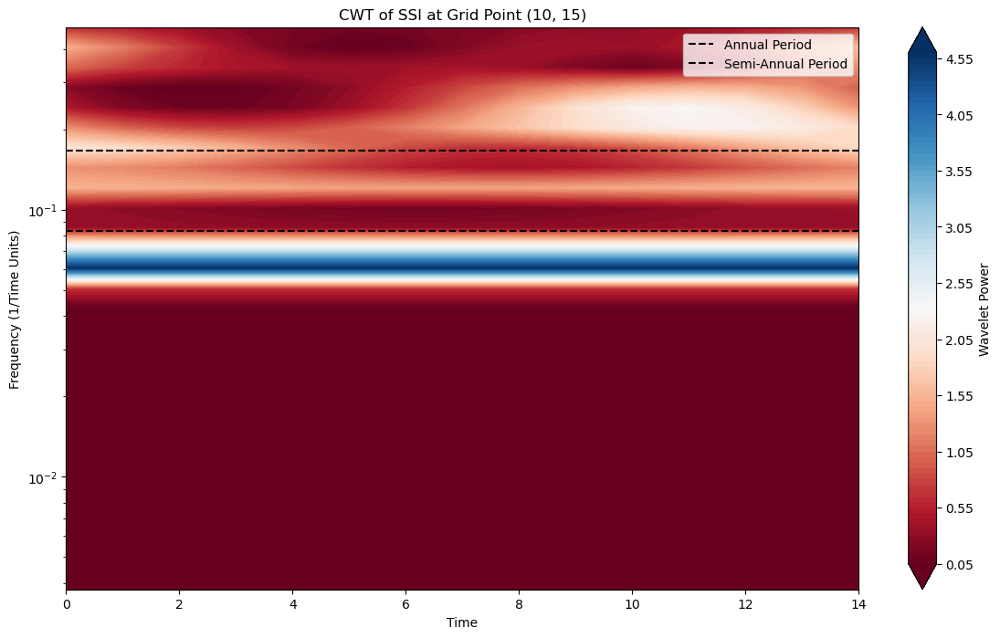

In [52]:
ssi_cross_wavelet = cross_wavelet(ssi_values, 10, 15, "SSI")

In [53]:
from scipy.stats import kendalltau

def mann_kendall_test(time_series):
    """ Perform Mann-Kendall test on a time series data. """
    # Time series should be a 1D array or list of values
    tau, p_value = kendalltau(np.arange(len(time_series)), time_series)
    return tau, p_value

# Example: Compute Mann-Kendall test for SSI time series at a specific grid point
time_series_yearly = ssi_combined_yearly[:, 10, 15].values  # Example grid point
tau, p_value = mann_kendall_test(time_series_yearly)

print(f'Mann-Kendall Tau: {tau:.3f}')
print(f'P-value: {p_value:.3f}')

Mann-Kendall Tau: -0.086
P-value: 0.697


In [54]:
# Example: Compute Mann-Kendall test for SSI time series at a specific grid point
time_series_monthly = ssi_combined_monthly[:, 10, 15].values  # Example grid point
tau, p_value = mann_kendall_test(time_series_monthly)

print(f'Mann-Kendall Tau: {tau:.3f}')
print(f'P-value: {p_value:.3f}')

Mann-Kendall Tau: 0.029
P-value: 0.575


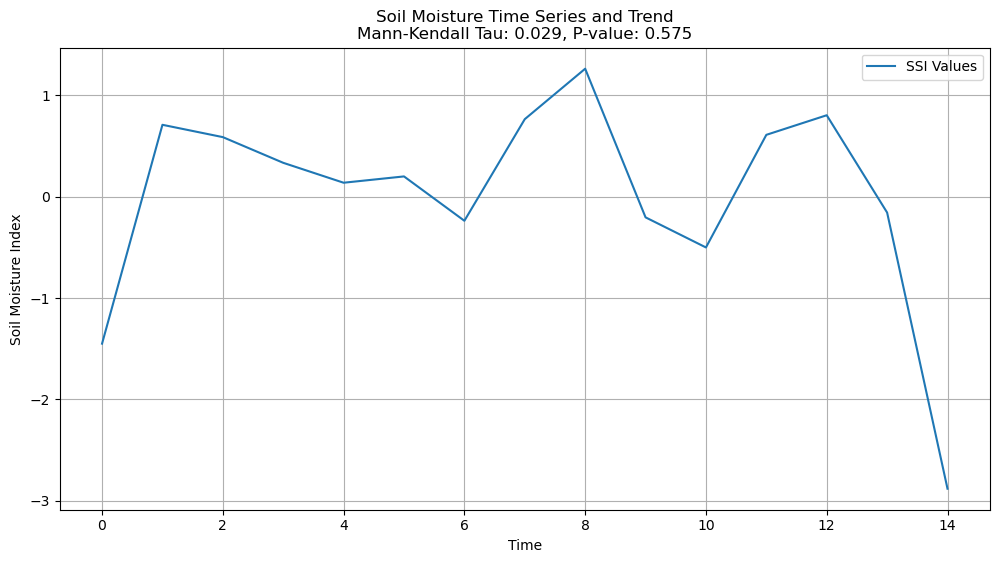

In [55]:
import matplotlib.pyplot as plt

def plot_trend(time_series, tau, p_value):
    """ Plot time series data and trend line. """
    plt.figure(figsize=(12, 6))
    plt.plot(time_series, label='SSI Values')
    plt.xlabel('Time')
    plt.ylabel('Soil Moisture Index')
    plt.title(f'Soil Moisture Time Series and Trend\nMann-Kendall Tau: {tau:.3f}, P-value: {p_value:.3f}')
    plt.legend()
    plt.grid(True)
    plt.show()

# Example: Plot trend for SSI time series
plot_trend(time_series_yearly, tau, p_value)

In [56]:
#The positive Tau value (0.029) suggests a slight upward trend in SSI on a monthly scale, indicating slightly wetter conditions. 
#However, this trend is extremely weak.
#The P-value (0.575) is high, indicating that the observed trend is not statistically significant on a monthly basis either. 
#This implies that there is no clear, consistent trend in the monthly SSI data.

In [57]:
#The Soil Moisture Index (SMI) is an effective measure for evaluating drought conditions by assessing soil moisture levels.

In [58]:
def calculate_smi(soil_moisture_layer):
    """
    Calculate the Soil Moisture Index (SMI) for the given soil moisture data.
    
    Parameters:
        soil_moisture_layer (xr.DataArray): Soil moisture data for a specific profile layer.
    
    Returns:
        xr.DataArray: Calculated SMI values, normalized between 0 and 1.
    """
    # Calculate min and max soil moisture over time
    sm_min = soil_moisture_layer.min(dim='time')
    sm_max = soil_moisture_layer.max(dim='time')
    
    # Compute the Soil Moisture Index (SMI)
    smi = (soil_moisture_layer - sm_min) / (sm_max - sm_min)
    smi = smi.clip(min=0, max=1)  # Ensure SMI values are within the range [0, 1]
    
    return smi

def plot_smi(smi, latitude, longitude):
    """
    Plot the latest Soil Moisture Index (SMI) using Cartopy's PlateCarree projection.
    
    Parameters:
        smi (xr.DataArray): Soil Moisture Index data.
        latitude (xr.DataArray): Latitude values.
        longitude (xr.DataArray): Longitude values.
    """
    # Select the latest time step for visualization
    smi_latest = smi.isel(time=-1)

    time_label = pd.to_datetime(str(smi_latest.time.values)).strftime('%D')
    
    # Set up the figure and Cartopy plot
    plt.figure(figsize=(12, 8))
    ax = plt.axes(projection=ccrs.PlateCarree())
    
    # Define the dynamic extent using latitude and longitude values
    extent = [longitude.min(), longitude.max(), latitude.min(), latitude.max()]
    
    # Plot the SMI data with a color map
    img = ax.imshow(
        smi_latest.values,
        origin='lower',
        extent=extent,
        cmap='RdYlBu',
        vmin=0,
        vmax=1
    )
    
    # Add map features
    ax.coastlines()
    ax.set_title(f'Soil Moisture Index (SMI) - Latest Time Step ({time_label})')
    plt.colorbar(img, ax=ax, orientation='vertical', label='SMI Value')
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.show()

    # Print summary statistics of the SMI
    print(f"SMI Summary Statistics:\nMin: {smi.min().values}\nMax: {smi.max().values}\nMean: {smi.mean().values}")

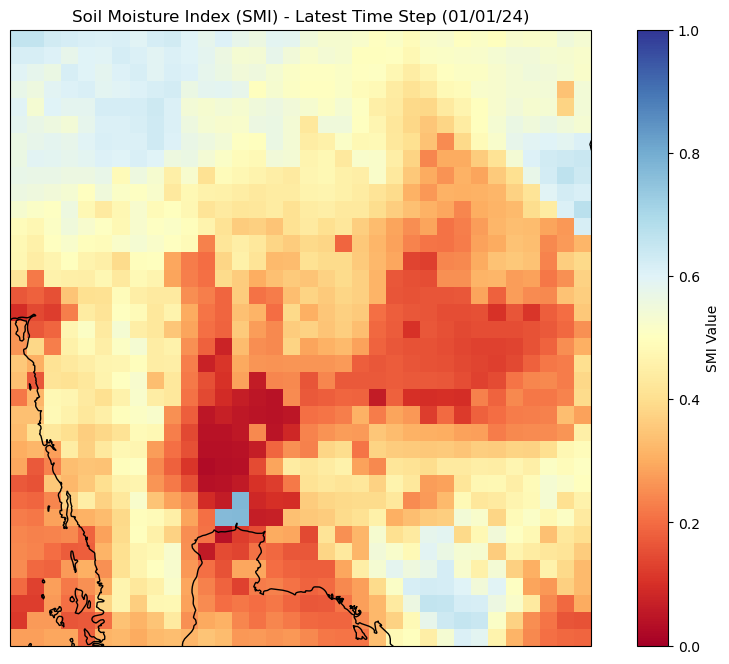

SMI Summary Statistics:
Min: 0.0
Max: 1.0
Mean: 0.581523597240448


In [59]:
# Select a specific profile layer, e.g., the first layer (topsoil)
soil_moisture_layer = soil_moisture.sel(SoilMoist_profiles=0)

smi = calculate_smi(soil_moisture_layer)

plot_smi(smi, latitude, longitude)

In [60]:
combined_soil_moisture.shape

(5113, 36, 34)

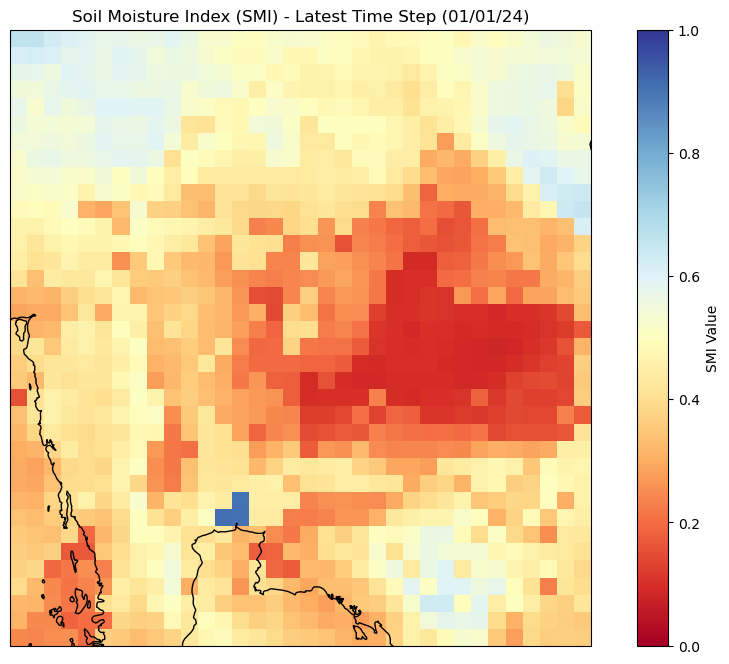

SMI Summary Statistics:
Min: 0.0
Max: 1.0
Mean: 0.5254812836647034


In [61]:
smi_combined = calculate_smi(combined_soil_moisture)

plot_smi(smi_combined, latitude, longitude)

In [62]:
def calculate_yearly_smi(soil_moisture_layer):
    """
    Calculate the Soil Moisture Index (SMI) aggregated by year.
    
    Parameters:
        soil_moisture_layer (xr.DataArray): Soil moisture data for a specific profile layer.
    
    Returns:
        xr.DataArray: Calculated yearly SMI values, normalized between 0 and 1.
    """
    # Resample the data to yearly averages
    yearly_soil_moisture = soil_moisture_layer.resample(time='1YE').mean()
    
    # Calculate min and max soil moisture over time for normalization
    sm_min = yearly_soil_moisture.min(dim='time')
    sm_max = yearly_soil_moisture.max(dim='time')
    
    # Compute the Soil Moisture Index (SMI)
    smi_yearly = (yearly_soil_moisture - sm_min) / (sm_max - sm_min)
    smi_yearly = smi_yearly.clip(min=0, max=1)  # Ensure SMI values are within the range [0, 1]

    # Print summary statistics of the SMI
    print(f"SMI Summary Statistics:\nMin: {smi_yearly.min().values}\nMax: {smi_yearly.max().values}\nMean: {smi_yearly.mean().values}")
    
    return smi_yearly

SMI Summary Statistics:
Min: 0.0
Max: 1.0
Mean: 0.6478521227836609


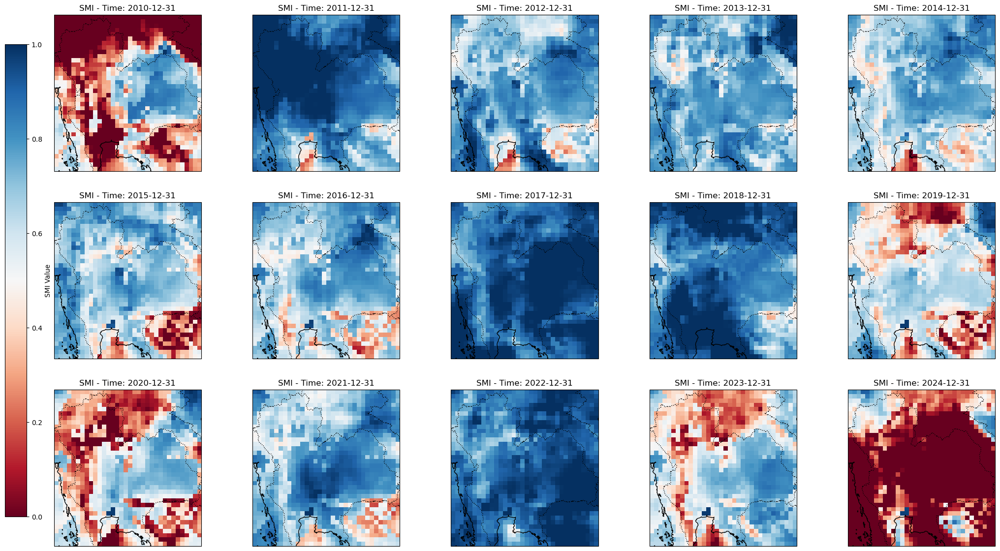

In [63]:
smi_yearly = calculate_yearly_smi(combined_soil_moisture)

#plot_yearly_smi(smi_yearly, latitude, longitude)
plot_sm_subplots(smi_yearly, 'SMI' , lat, lon, vmin = 0 , vmax = 1 , cols=5 )

In [64]:
from scipy.stats import theilslopes

def calculate_theil_sen(data):
    """
    Calculate the Theil-Sen estimator for each grid point in the dataset.
    
    Parameters:
        smi_data (xr.DataArray): The Soil Moisture Index data array with dimensions (time, north_south, east_west).
    
    Returns:
        trend_slope (xr.DataArray): The slope of the trend for each grid point.
        trend_intercept (xr.DataArray): The intercept of the trend for each grid point.
    """
    # Get the time dimension size and initialize arrays to store slope and intercept
    time_dim = data.time.size
    trend_slope = np.full((data.shape[1], data.shape[2]), np.nan)  # Create 2D arrays for slope
    trend_intercept = np.full((data.shape[1], data.shape[2]), np.nan)  # Create 2D arrays for intercept
    
    
    # Extract time values as integer indices for slope calculation
    time_values = np.arange(time_dim)

    # Iterate over each grid point (north_south, east_west) to calculate the slope
    for i in range(data.shape[1]):  # Loop over north_south dimension
        for j in range(data.shape[2]):  # Loop over east_west dimension
            # Extract the time series for each grid point
            series = data[:, i, j].values
            
            # Check for NaNs and skip if too many are present
            if np.isnan(series).sum() > time_dim * 0.3:  # Skip if more than 30% of values are NaN
                continue
            
            # Remove NaNs from the series for calculation
            valid_time = time_values[~np.isnan(series)]
            valid_series = series[~np.isnan(series)]
            
            # Ensure there are enough data points for trend calculation
            if len(valid_series) > 10:  # Require at least 10 points
                # Calculate Theil-Sen slope and intercept
                slope, intercept, _, _ = theilslopes(valid_series, valid_time)
                trend_slope[i, j] = slope
                trend_intercept[i, j] = intercept

    # Convert slopes and intercepts back into xarray DataArrays with coordinates
    trend_slope_da = xr.DataArray(trend_slope, coords=[data.north_south, data.east_west], dims=['north_south', 'east_west'])
    trend_intercept_da = xr.DataArray(trend_intercept, coords=[data.north_south, data.east_west], dims=['north_south', 'east_west'])
    
    return trend_slope_da, trend_intercept_da

In [65]:
def plot_trend(trend_slope, latitude, longitude, data_name):
    """
    Plot the spatial distribution of the Theil-Sen slope using Cartopy.
    
    Parameters:
        trend_slope (xr.DataArray): The slope of the trend for each grid point.
        latitude (xr.DataArray): Latitude values.
        longitude (xr.DataArray): Longitude values.
        data_name (str): Name of the data for plot title.
    """
    # Define the extent dynamically
    extent = [longitude.min(), longitude.max(), latitude.min(), latitude.max()]

    # Set up the figure
    fig, ax = plt.subplots(figsize=(12, 8), subplot_kw={'projection': ccrs.PlateCarree()})

    # Confirm the shape is correct before plotting
    if trend_slope.ndim != 2:
        print(f"Error: Expected 2D data, but got shape {trend_slope.shape}.")
        return
        
    # Plot the slope data
    img = ax.imshow(trend_slope, extent=extent, cmap='coolwarm', origin='lower', transform=ccrs.PlateCarree())
     
    ax.coastlines()
    ax.set_title(f'{data_name}')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    
    # Add colorbar
    cbar = fig.colorbar(img, ax=ax, orientation='vertical', fraction=0.046, pad=0.04)
    cbar.set_label('Trend Slope')
    plt.show()

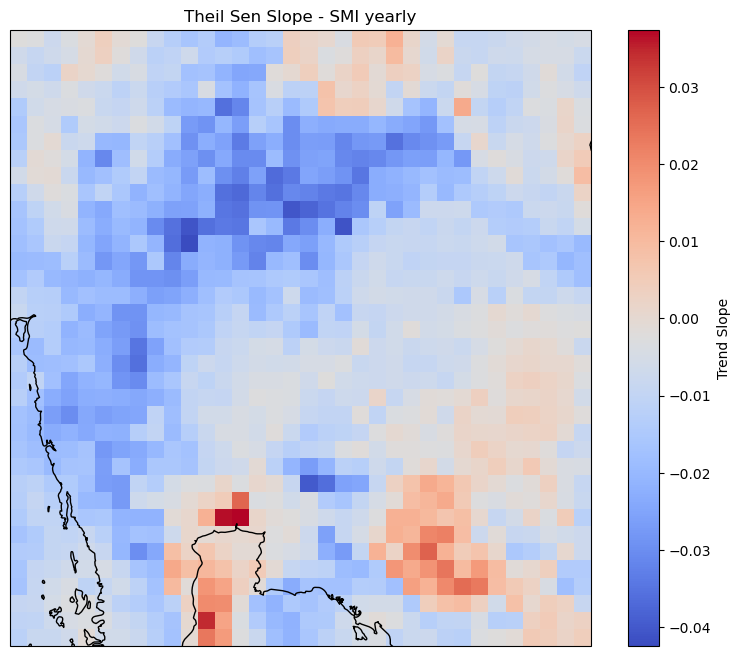

In [66]:
smi_trend_slope, smi_trend_intercept = calculate_theil_sen(smi_yearly)

plot_trend(smi_trend_slope, lat, lon, "Theil Sen Slope - SMI yearly")

In [67]:
import statsmodels.api as sm

def calculate_ols_trend(data):
    """
    Calculate the OLS trend for each grid point in the dataset.

    Parameters:
        smi_data (xr.DataArray): Soil Moisture Index data with dimensions (time, north_south, east_west).

    Returns:
        trend_slope (xr.DataArray): The slope of the trend for each grid point.
        trend_intercept (xr.DataArray): The intercept of the trend for each grid point.
    """
    # Prepare arrays to store the slope and intercept
    trend_slope = np.full((data.shape[1], data.shape[2]), np.nan)
    trend_intercept = np.full((data.shape[1], data.shape[2]), np.nan)

    # Extract time values as numbers (e.g., year numbers)
    time_values = data.time.dt.year.values

    for i in range(data.shape[1]):  # Loop over the north_south dimension
        for j in range(data.shape[2]):  # Loop over the east_west dimension
            # Extract the time series for each grid point
            series = data[:, i, j].values
            
            # Remove NaN values
            valid_mask = ~np.isnan(series)
            valid_time = time_values[valid_mask]
            valid_series = series[valid_mask]

            # Ensure there are enough points for regression
            if len(valid_series) > 2:
                # Add a constant (intercept) term to the regression model
                X = sm.add_constant(valid_time)
                model = sm.OLS(valid_series, X)
                results = model.fit()
                
                # Store the slope and intercept
                trend_slope[i, j] = results.params[1]  # Slope
                trend_intercept[i, j] = results.params[0]  # Intercept

    # Convert slopes and intercepts back into xarray DataArrays with coordinates
    trend_slope_da = xr.DataArray(trend_slope, coords=[data.north_south, data.east_west], dims=['north_south', 'east_west'])
    trend_intercept_da = xr.DataArray(trend_intercept, coords=[data.north_south, data.east_west], dims=['north_south', 'east_west'])
    
    return trend_slope_da, trend_intercept_da

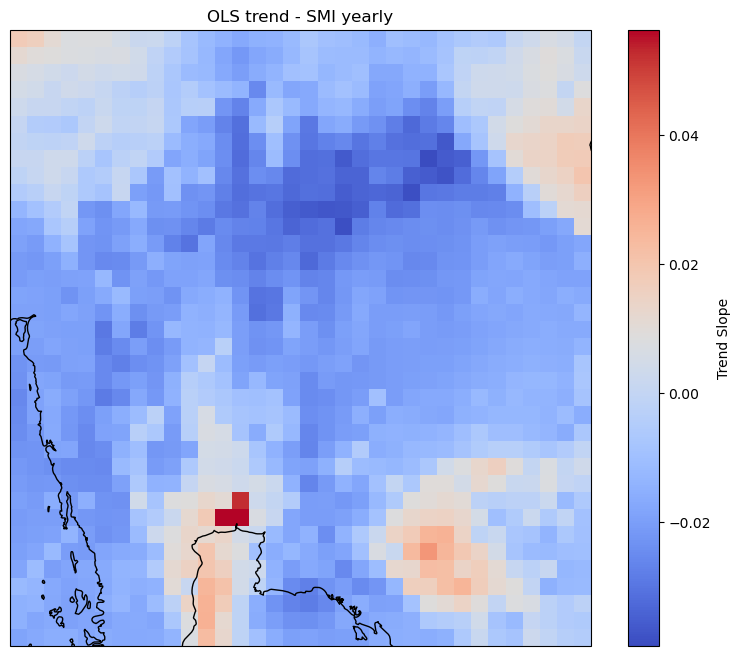

In [68]:
smi_ols_trend, smi_trend_intercept = calculate_ols_trend(smi_yearly)

plot_trend(smi_ols_trend, lat, lon, "OLS trend - SMI yearly")

In [69]:
from statsmodels.tsa.seasonal import STL

def decompose_time_series(data, period):
    """
    Perform STL decomposition on soil moisture data.

    Parameters:
        smi_data (xr.DataArray): Soil Moisture Index data with dimensions (time, north_south, east_west).
        period (int): The seasonal period (e.g., 12 for monthly data with yearly seasonality).

    Returns:
        trend_component (xr.DataArray): Trend component of the decomposition.
        seasonal_component (xr.DataArray): Seasonal component of the decomposition.
        residual_component (xr.DataArray): Residual component of the decomposition.
    """
    # Prepare arrays to store the decomposed components
    trend = np.full(data.shape, np.nan)
    seasonal = np.full(data.shape, np.nan)
    residual = np.full(data.shape, np.nan)

    # Loop over each grid point
    for i in range(data.shape[1]):  # Loop over north_south
        for j in range(data.shape[2]):  # Loop over east_west
            # Extract the time series for each grid point
            series = data[:, i, j].values
            
            # Remove NaN values for decomposition
            valid_mask = ~np.isnan(series)
            valid_series = series[valid_mask]

            if len(valid_series) > period:
                # Convert the series to a pandas Series with DateTime index for STL
                time_index = pd.to_datetime(data.time.values[valid_mask])
                series_pd = pd.Series(valid_series, index=time_index)
                
                # Perform STL decomposition
                stl = STL(series_pd, seasonal=13, period=period)
                result = stl.fit()
                
                # Store decomposed components back into the arrays
                trend[valid_mask, i, j] = result.trend
                seasonal[valid_mask, i, j] = result.seasonal
                residual[valid_mask, i, j] = result.resid

    # Convert components back to xarray DataArrays with the original coordinates
    trend_component = xr.DataArray(trend, coords=data.coords, dims=data.dims)
    seasonal_component = xr.DataArray(seasonal, coords=data.coords, dims=data.dims)
    residual_component = xr.DataArray(residual, coords=data.coords, dims=data.dims)

    return trend_component, seasonal_component, residual_component

In [70]:
def plot_decomposition(trend, seasonal, residual, latitude, longitude, data_name):
    """
    Plot the trend, seasonal, and residual components using Cartopy.

    Parameters:
        trend (xr.DataArray): Trend component of the decomposition.
        seasonal (xr.DataArray): Seasonal component of the decomposition.
        residual (xr.DataArray): Residual component of the decomposition.
        latitude (xr.DataArray): Latitude values.
        longitude (xr.DataArray): Longitude values.
        data_name (str): Name of the data for plot titles.
    """
    # Define the extent dynamically
    extent = [longitude.min(), longitude.max(), latitude.min(), latitude.max()]

    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(18, 6), subplot_kw={'projection': ccrs.PlateCarree()})

    # Plot Trend
    img1 = axes[0].imshow(trend.mean(dim='time'), extent=extent, cmap='coolwarm', origin='lower', transform=ccrs.PlateCarree())
    axes[0].coastlines()
    axes[0].set_title(f'Trend - {data_name}')
    fig.colorbar(img1, ax=axes[0], orientation='vertical', fraction=0.046, pad=0.04)

    # Plot Seasonal
    img2 = axes[1].imshow(seasonal.mean(dim='time'), extent=extent, cmap='coolwarm', origin='lower', transform=ccrs.PlateCarree())
    axes[1].coastlines()
    axes[1].set_title(f'Seasonal - {data_name}')
    fig.colorbar(img2, ax=axes[1], orientation='vertical', fraction=0.046, pad=0.04)

    # Plot Residual
    img3 = axes[2].imshow(residual.mean(dim='time'), extent=extent, cmap='coolwarm', origin='lower', transform=ccrs.PlateCarree())
    axes[2].coastlines()
    axes[2].set_title(f'Residual - {data_name}')
    fig.colorbar(img3, ax=axes[2], orientation='vertical', fraction=0.046, pad=0.04)

    plt.tight_layout()
    plt.show()

In [71]:
len(smi_yearly.time.values)

15

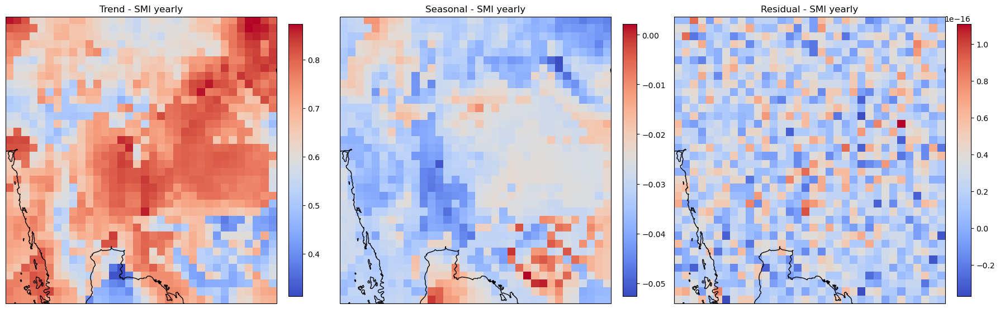

In [72]:
# Example Usage

#period = len(smi_yearly.time.values)  # e.g., yearly seasonality 
period = 14
smi_trend, smi_seasonal, smi_residual = decompose_time_series(smi_yearly, period)

plot_decomposition(smi_trend, smi_seasonal, smi_residual, latitude, longitude, data_name='SMI yearly')


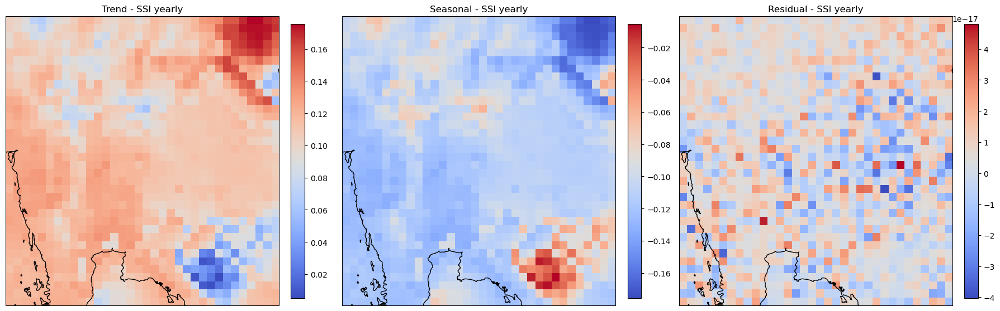

In [73]:
ssi_trend, ssi_seasonal, ssi_residual = decompose_time_series(ssi_yearly, period)

plot_decomposition(ssi_trend, ssi_seasonal, ssi_residual, latitude, longitude, data_name='SSI yearly')

In [74]:
combined_soil_moisture.shape

(5113, 36, 34)

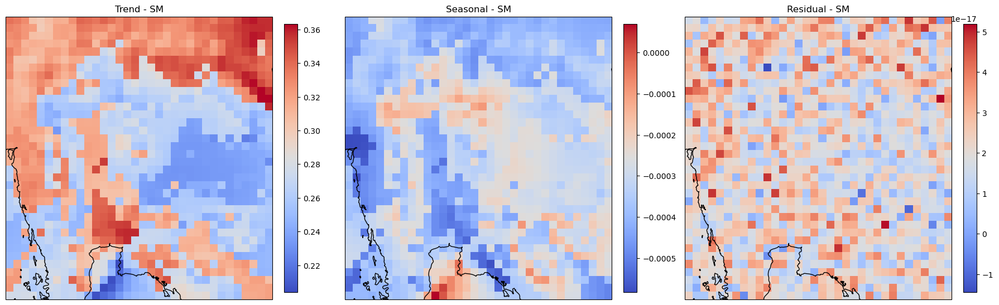

In [75]:
period = 168
sm_trend, sm_seasonal, sm_residual = decompose_time_series(combined_soil_moisture.resample(time='1ME').mean(), period)

plot_decomposition(sm_trend, sm_seasonal, sm_residual, latitude, longitude, data_name='SM')

In [76]:
soil_mean_timeseries = soil_moisture.mean(dim=['SoilMoist_profiles', 'north_south', 'east_west']) #get a single time series
soil_mean_timeseries = soil_mean_timeseries.to_series()  # Converts xarray to pandas Series

print(soil_mean_timeseries.shape)

(5113,)


In [77]:
#Analyze the decomposed components to understand the behavior of soil moisture over time.
#Use the trend component to assess long-term changes, the seasonal component to explore periodic variations, 
#and the residual to evaluate random fluctuations.

In [78]:
import pycwt as wavelet

# Normalize the time series (mean=0, std=1)
streamflow_normalized = (Streamflow - np.mean(Streamflow)) / np.std(Streamflow)
tws_normalized = (tws - np.mean(tws)) / np.std(tws)
soil_moisture_normalized = (combined_soil_moisture - np.mean(combined_soil_moisture)) / np.std(combined_soil_moisture)

In [79]:
stream_timeseries = Streamflow.mean(dim=['north_south', 'east_west']) #get a single time series
stream_timeseries = stream_timeseries.to_series()  # Converts xarray to pandas Series

print(stream_timeseries.shape)

(5113,)


In [80]:
tws_timeseries = tws.mean(dim=['north_south', 'east_west']) #get a single time series
tws_timeseries = tws_timeseries.to_series()  # Converts xarray to pandas Series

print(tws_timeseries.shape)

(5113,)


In [81]:
time = np.arange(len(soil_mean_timeseries))  # Array of time indices
time.shape

(5113,)

In [82]:
print(streamflow_normalized.shape)
print(tws_normalized.shape)

(5113, 36, 34)
(5113, 36, 34)


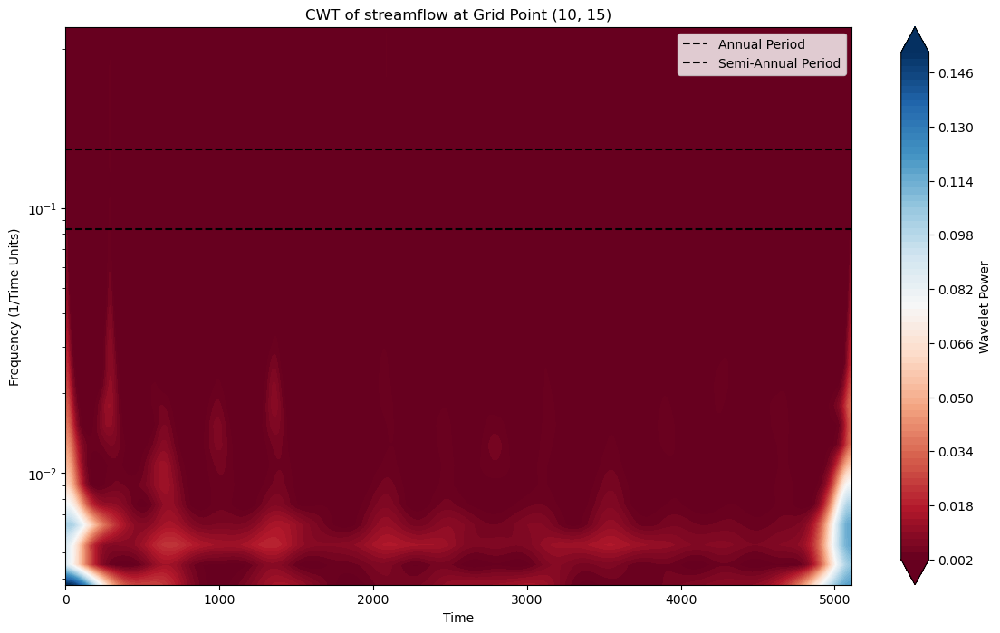

In [83]:
streamflow_cross_wavelet = cross_wavelet(streamflow_normalized, 10, 15, "streamflow")

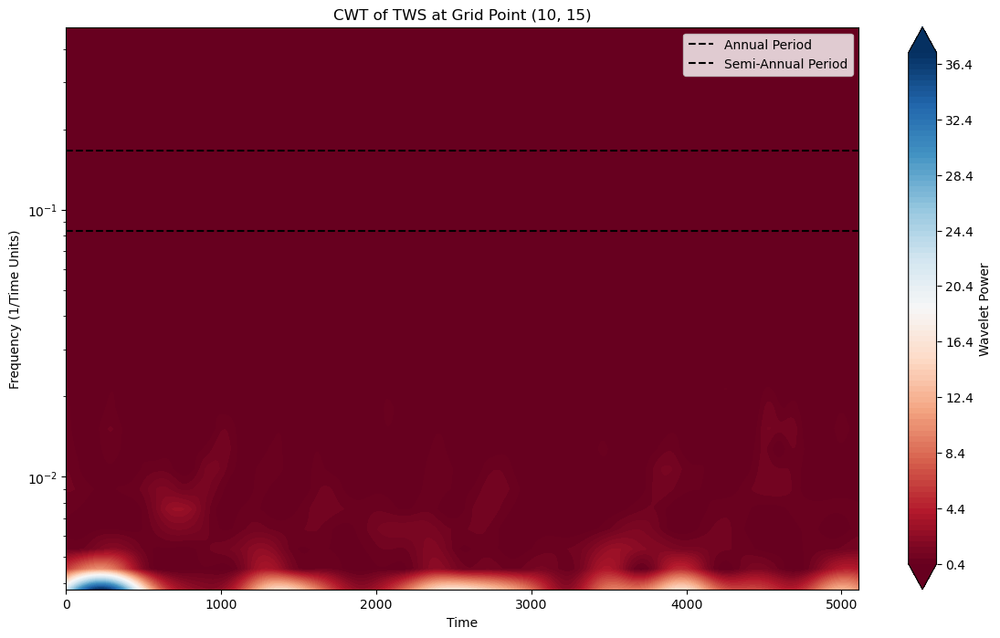

In [84]:
tws_cross_wavelet = cross_wavelet(tws_normalized, 10, 15, "TWS")

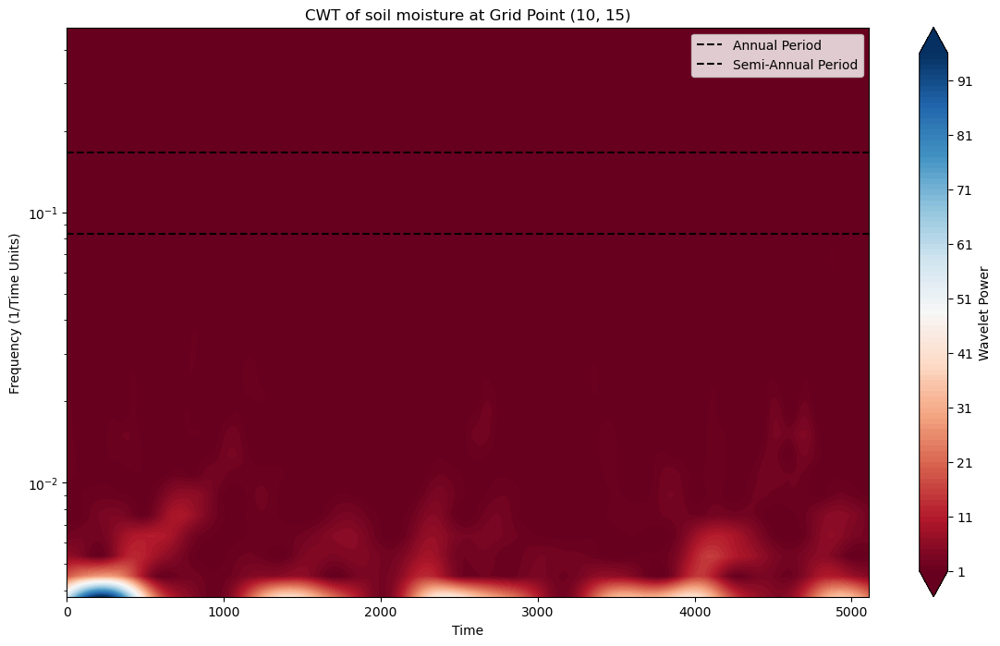

In [85]:
soil_moisture_cross_wavelet = cross_wavelet(soil_moisture_normalized, 10, 15, "soil moisture")

In [86]:
soil_moisture_normalized.shape

(5113, 36, 34)

In [87]:
def clean_data(data):
    """
    Cleans the data by removing NaNs and infinite values.
    - Interpolates missing values (NaNs).
    - Replaces Infs with the maximum finite value.
    
    Returns:
    - Cleaned data.
    """
    # Remove Infs by replacing them with the maximum finite value in the array
    data = np.where(np.isinf(data), np.nan, data)  # Replace Infs with NaN
    finite_data = data[np.isfinite(data)]  # Keep only finite values for stats
    
    # Check if the entire series is NaN or Inf
    if len(finite_data) == 0:
        print("Warning: Time series contains only NaNs or Infs.")
        return np.zeros_like(data)  # Return a zero-filled array if the series is invalid
    
    # Replace NaNs with interpolated values
    nans = np.isnan(data)
    if np.any(nans):
        # Simple linear interpolation for NaNs
        data[nans] = np.interp(np.flatnonzero(nans), np.flatnonzero(~nans), data[~nans])
    
    return data

In [88]:
streamflow_clean = clean_data(streamflow_normalized)

In [89]:
from scipy.signal import detrend

def process_and_detrend_data(soil_ts, stream_ts):
    # Clean the data
    soil_ts_clean = clean_data(soil_ts)
    stream_ts_clean = clean_data(stream_ts)
    
    # Apply detrending (removes linear trend)
    soil_ts_detrended = detrend(soil_ts_clean)
    stream_ts_detrended = detrend(stream_ts_clean)
    
    return soil_ts_detrended, stream_ts_detrended

In [90]:
soil_ts_detrended, stream_ts_detrended = process_and_detrend_data(soil_moisture_normalized, streamflow_clean)

In [91]:
soil_ts_detrended, tws_ts_detrended = process_and_detrend_data(soil_moisture_normalized, tws_normalized)

In [92]:
def cross_wavelet_xwt(soil_moisture_ts, streamflow_ts, selected_lat, selected_lon, name):
    """
    Perform Cross-Wavelet Transform (XWT) between two time series over a spatial grid.
    
    Parameters:
    - soil_moisture_ts: 3D array of soil moisture time series [time, lat, lon].
    - streamflow_ts: 3D array of streamflow time series [time, lat, lon].
    - selected_lat: Index of the latitude to analyze in detail.
    - selected_lon: Index of the longitude to analyze in detail.
    - name: Name for the plot title to specify the analyzed variable.
    
    Returns:
    - xwt_powers: 4D array of cross-wavelet power [lat, lon, freqs, time].
    """

    # Time parameters
    dt = 1  # Daily time steps
    time = np.arange(soil_moisture_ts.shape[0])  # Time indices
    mother = wavelet.Morlet()  # Morlet wavelet, commonly used for XWT
    dj = 0.25  # Scale resolution
    s0 = 2 * dt  # Smallest scale in days
    J = 7 / dj  # Number of scales

    # Initialize array to store XWT power for each grid point
    xwt_powers = np.empty((soil_moisture_ts.shape[1], soil_moisture_ts.shape[2], int(J) + 1, len(time)))

    # Loop through each grid point (latitude, longitude)
    for lat_idx in range(soil_moisture_ts.shape[1]):  # Loop over latitude indices
        for lon_idx in range(soil_moisture_ts.shape[2]):  # Loop over longitude indices
            # Extract the time series for the current grid point
            soil_ts = soil_moisture_ts[:, lat_idx, lon_idx]
            stream_ts = streamflow_ts[:, lat_idx, lon_idx]

            # Clean and detrend the time series
            soil_ts_detrended, stream_ts_detrended = process_and_detrend_data(soil_ts, stream_ts)

            # Check if the time series has enough length
            if len(soil_ts_detrended) < s0 or len(stream_ts_detrended) < s0:
                print(f"Warning: Time series at ({lat_idx}, {lon_idx}) is too short.")
                continue

            try:
                # Perform Cross-Wavelet Transform (XWT)
                W12, scales, freqs, coi = wavelet.xwt(soil_ts_detrended, stream_ts_detrended, dt, dj=dj, s0=s0, J=J, wavelet=mother)

                # Calculate cross-wavelet power
                cross_wavelet_power = np.abs(W12) ** 2

                # Store cross-wavelet power in the array
                xwt_powers[lat_idx, lon_idx, :, :] = cross_wavelet_power

            except Exception as e:
                print(f"Error processing data at ({lat_idx}, {lon_idx}): {e}")

    # Plotting the cross-wavelet power for the selected latitude and longitude
    plt.figure(figsize=(14, 8))
    plt.contourf(time, freqs, xwt_powers[selected_lat, selected_lon, :, :], levels=100, cmap='RdBu', extend='both')
    plt.colorbar(label='Cross-Wavelet Power')
    plt.title(f'Cross-Wavelet Power of {name} at Grid Point ({selected_lat}, {selected_lon})')
    plt.xlabel('Time')
    plt.ylabel('Frequency (1/Time Units)')
    plt.yscale('log')
    plt.axhline(1 / 12, color='k', linestyle='--', label='Annual Period')
    plt.axhline(1 / 6, color='k', linestyle='--', label='Semi-Annual Period')
    plt.legend()
    plt.show()

    return xwt_powers

Error processing data at (0, 5): Cannot place an upperbound on the unbiased AR(1). Series is too short or trend is to large.
Error processing data at (0, 10): Cannot place an upperbound on the unbiased AR(1). Series is too short or trend is to large.
Error processing data at (0, 11): Cannot place an upperbound on the unbiased AR(1). Series is too short or trend is to large.
Error processing data at (0, 12): Cannot place an upperbound on the unbiased AR(1). Series is too short or trend is to large.
Error processing data at (0, 13): Cannot place an upperbound on the unbiased AR(1). Series is too short or trend is to large.
Error processing data at (0, 14): Cannot place an upperbound on the unbiased AR(1). Series is too short or trend is to large.
Error processing data at (0, 25): Cannot place an upperbound on the unbiased AR(1). Series is too short or trend is to large.
Error processing data at (0, 27): Cannot place an upperbound on the unbiased AR(1). Series is too short or trend is to 

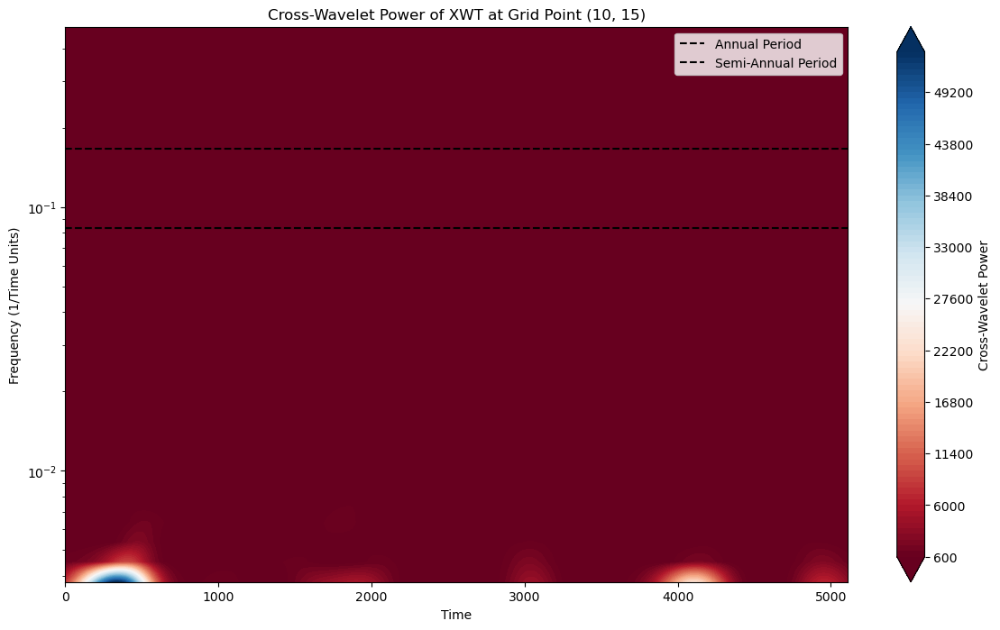

array([[[[9.70466016e-03, 6.26663700e-03, 2.68699390e-03, ...,
          1.53986803e-04, 3.91444510e-04, 6.46860805e-04],
         [4.43062635e-02, 2.47754109e-02, 7.48540281e-03, ...,
          4.69141067e-04, 1.55313803e-03, 2.82698975e-03],
         [6.25993394e-02, 3.72714364e-02, 1.25386859e-02, ...,
          7.93716386e-04, 2.23118376e-03, 3.73814706e-03],
         ...,
         [4.49117230e+02, 4.51753324e+02, 4.54360344e+02, ...,
          2.72757366e+02, 2.71479769e+02, 2.70179218e+02],
         [1.97838299e+03, 1.99132542e+03, 2.00420241e+03, ...,
          1.41176335e+03, 1.40094618e+03, 1.39010585e+03],
         [3.54147292e+03, 3.55455019e+03, 3.56743347e+03, ...,
          4.50690851e+03, 4.47347812e+03, 4.44004397e+03]],

        [[5.16334559e-03, 3.23436504e-03, 1.31472892e-03, ...,
          1.40491720e-04, 3.54765387e-04, 5.83794874e-04],
         [2.40367219e-02, 1.34564381e-02, 4.08680922e-03, ...,
          4.23641521e-04, 1.40516223e-03, 2.55871813e-03],
        

In [93]:
#cross_wavelet_xwt(soil_moisture_ts, streamflow_ts, selected_lat, selected_lon, name)
cross_wavelet_xwt(soil_ts_detrended, tws_ts_detrended, 10, 15, "XWT")

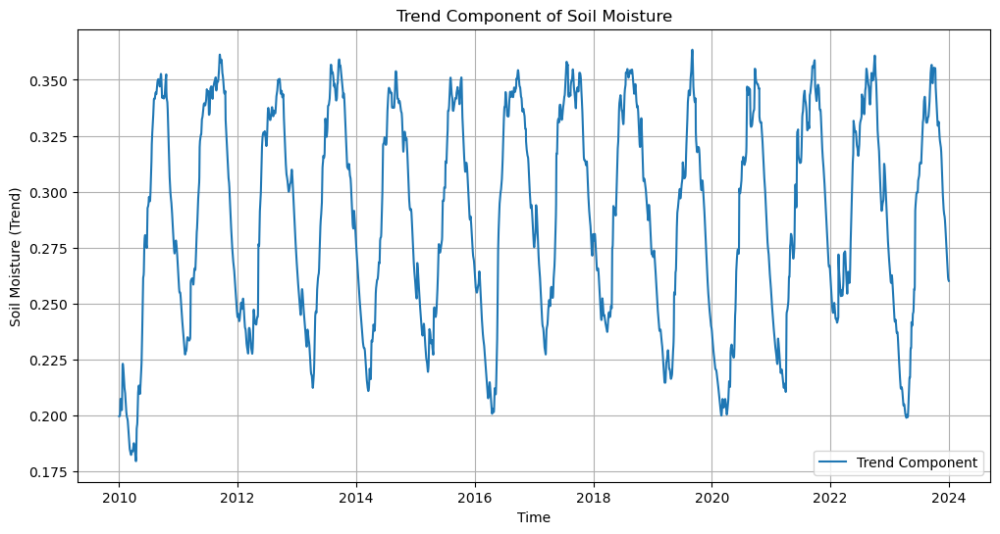

Mann-Kendall Tau: 0.029
P-value: 0.575
The trend is not statistically significant (p ≥ 0.05).


In [94]:
import pymannkendall as mk

soil_mean_timeseries.index = pd.to_datetime(soil_mean_timeseries.index)  # Ensure index is datetime

# Step 3: Set the frequency if not already set (adjust 'D' for daily data)
if not soil_mean_timeseries.index.freq:
    soil_mean_timeseries = soil_mean_timeseries.asfreq('D')  # Set daily frequency; adjust as needed

# Step 4: Set the seasonal period for STL decomposition (e.g., 365 for daily data with yearly seasonality)
seasonal_period = 365  # Adjust this period based on your data frequency

# Step 5: Perform STL Decomposition
stl = STL(soil_mean_timeseries, seasonal=seasonal_period, robust=True)
result = stl.fit()

# Step 6: Extract Trend Component and Plot
trend = result.trend

plt.figure(figsize=(12, 6))
plt.plot(trend, label='Trend Component')
plt.title('Trend Component of Soil Moisture')
plt.xlabel('Time')
plt.ylabel('Soil Moisture (Trend)')
plt.grid(True)
plt.legend()
plt.show()

# Flatten trend to 1D array if required
trend_values = trend.dropna().values.flatten()  

# Perform the Mann-Kendall test
mk_result = mk.original_test(trend_values)  # Correct function call

# Step 8: Display Results of the Trend Test
print(f"Mann-Kendall Tau: {tau:.3f}")
print(f"P-value: {p_value:.3f}")

# Interpretation of Results
if p_value < 0.05:
    print("The trend is statistically significant (p < 0.05).")
    if tau > 0:
        print("There is a significant increasing trend in the soil moisture data.")
    else:
        print("There is a significant decreasing trend in the soil moisture data.")
else:
    print("The trend is not statistically significant (p ≥ 0.05).")

In [95]:
def plot_significant_variable_changes(ds, variable_name, percent_threshold=90):
    """
    Computes and plots regions with significant changes in TWS based on a given percentile threshold.

    Parameters:
    ds (xarray.Dataset): The input dataset containing TWS data.
    variable_name (str): The name of the TWS variable in the dataset.
    percent_threshold (int, optional): The percentile threshold to define significant changes. Default is 90.
    output_filename (str, optional): The filename for the saved plot. Default is 'RegionsChanges_TWS.png'.

    Returns:
    None
    """
    # Compute the standard deviation of the TWS variable along the time dimension
    std_dev = ds[variable_name].std(dim='time')
    std_dev_data = std_dev.values

    # Compute the threshold for significant changes based on the specified percentile
    significant_threshold = np.percentile(std_dev_data, percent_threshold)

    # Create a mask to identify significant changes
    significant_mask = std_dev_data > significant_threshold

    # Extract latitude and longitude coordinates for plotting
    lat = ds['lat'].values[0, :, 0]  # Extracting latitude values
    lon = ds['lon'].values[0, 0, :]  # Extracting longitude values

    # Plotting the regions with significant changes
    plt.figure(figsize=(10, 6))
    plt.pcolormesh(lon, lat, significant_mask, cmap='coolwarm', shading='nearest')
    plt.colorbar(label='Significant Change (1: Yes, 0: No)')
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.title(f'Regions with Significant Changes in {variable_name}')
    plt.show()

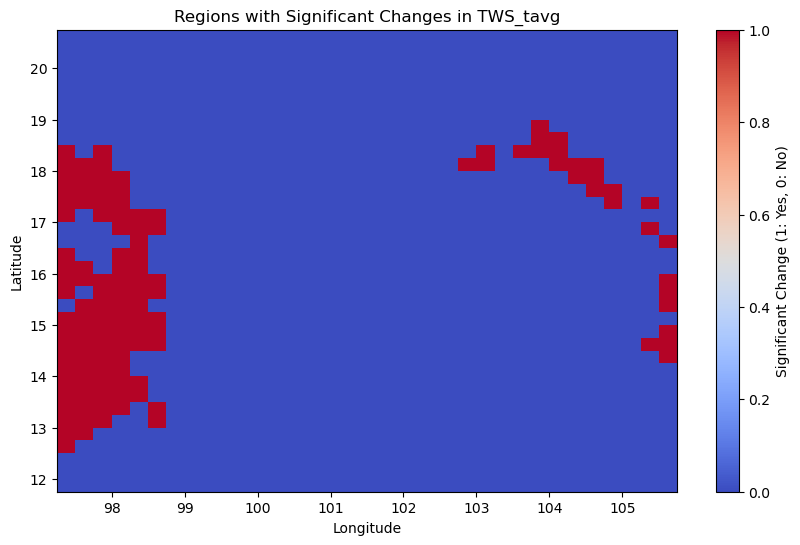

In [96]:
plot_significant_variable_changes(ds_surface, 'TWS_tavg', percent_threshold=90)

In [97]:
def plot_std_dev_distribution(data, variables, spatial_dims=['north_south', 'east_west'], percentile=90):
    """
    Plots the histogram of the standard deviation for each specified variable in the dataset.

    Args:
        data (xarray.Dataset): The dataset containing the variables.
        variables (list): List of variable names to plot.
        spatial_dims (list): List of spatial dimensions to average over (default: ['north_south', 'east_west']).
        percentile (float): The percentile value to highlight on the histogram (default: 90).

    Returns:
        None
    """
    for variable in variables:
        if variable in data.data_vars:
            # Calculate the standard deviation over the specified spatial dimensions
            std_dev_data = data[variable].std(dim=spatial_dims).values.flatten()

            # Calculate the percentile value
            percentile_value = np.percentile(std_dev_data, percentile)

            # Create the plot
            plt.figure(figsize=(10, 6))
            sns.histplot(std_dev_data, kde=True, color='blue', alpha=0.6)
            plt.axvline(percentile_value, color='red', linestyle='--', label=f'{percentile}th Percentile: {percentile_value:.2f}')
            plt.xlabel(f'Standard Deviation of {variable}')
            plt.ylabel('Frequency')
            plt.title(f'Distribution of {variable} Standard Deviation with {percentile}th Percentile')
            plt.legend(loc='upper left')
            plt.grid(True)
            plt.show()
        else:
            print(f"Variable '{variable}' not found in the dataset.")

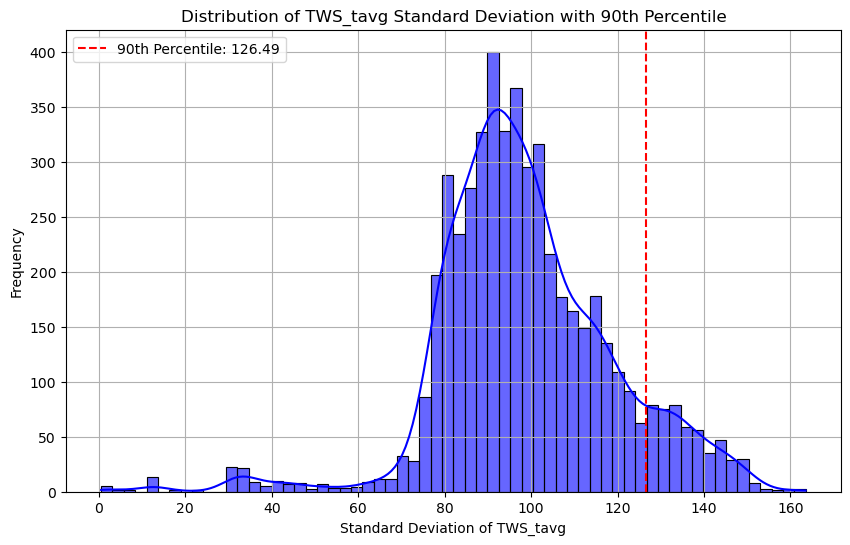

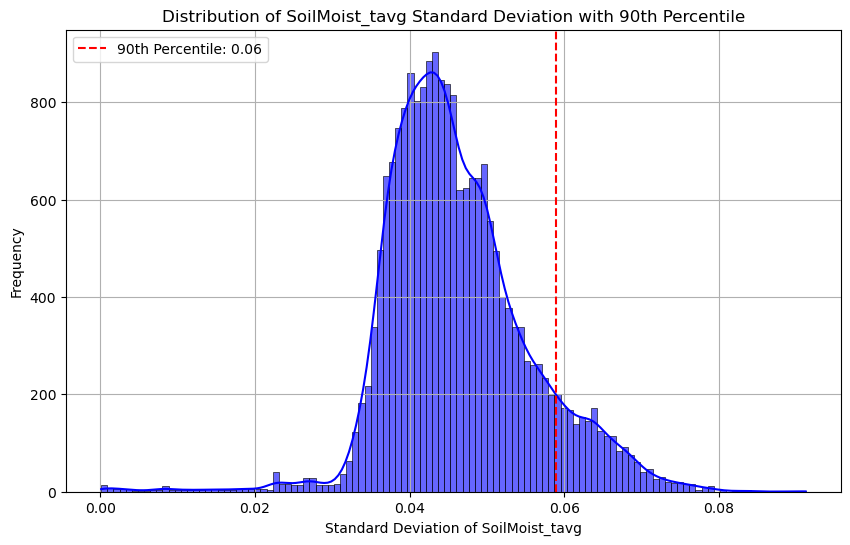

In [98]:
# Example usage:
if ds_surface:
    plot_std_dev_distribution(ds_surface, ['TWS_tavg', 'SoilMoist_tavg'], percentile=90) #other percentile thresholds (e.g., 50th, 75th).

In [99]:
# Compute trend of TWS
tws_trend = tws.polyfit(dim='time', deg=1)  # Linear trend

# Extract slope (trend) from the fit
trend_slope = tws_trend.polyfit_coefficients.sel(degree=1)

In [100]:
# Compute trend of soil_moisture
sm_trend = soil_moisture.polyfit(dim='time', deg=1)  # Linear trend

# Extract slope (trend) from the fit
sm_slope = sm_trend.polyfit_coefficients.sel(degree=1)

In [101]:
print(trend_slope.shape)
print(sm_slope[0,:,:].shape)

(36, 34)
(36, 34)


In [102]:
sm_slope_mean = sm_slope.mean(dim='SoilMoist_profiles')  # Average over spatial dimensions
print(sm_slope_mean.shape)

(36, 34)


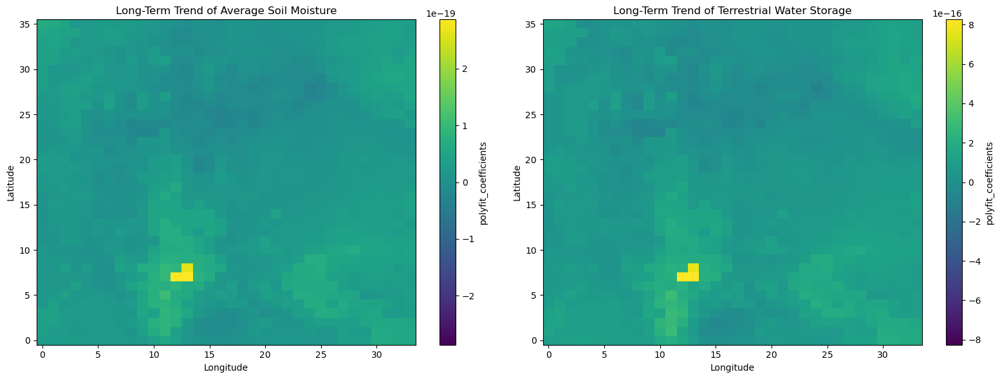

In [103]:
# Plot trend map subplots: 1 row, 2 columns
fig, axs = plt.subplots(1, 2, figsize=(16, 6))

# Plot Soil Moisture trend map
sm_slope_mean.plot(ax=axs[0], cmap='viridis')
axs[0].set_title('Long-Term Trend of Average Soil Moisture')
axs[0].set_xlabel('Longitude')
axs[0].set_ylabel('Latitude')

# Plot Terrestrial Water Storage trend map
trend_slope.plot(ax=axs[1], cmap='viridis')
axs[1].set_title('Long-Term Trend of Terrestrial Water Storage')
axs[1].set_xlabel('Longitude')
axs[1].set_ylabel('Latitude')

# Adjust layout for better visualization
plt.tight_layout()
plt.show()

In [104]:
# Helper function to compute trend of a variable
def compute_trend(da):
    # Fit a linear trend to the data along the 'time' dimension
    trend = da.polyfit(dim='time', deg=1)
    # Extract the slope (trend) which represents the long-term change per time unit
    trend_slope = trend.polyfit_coefficients.sel(degree=1)
    return trend_slope

In [105]:
# Filtering variables that have a time dimension and plotting their trends
variables_to_plot = [var for var in ds_surface.data_vars if 'time' in ds_surface[var].dims]

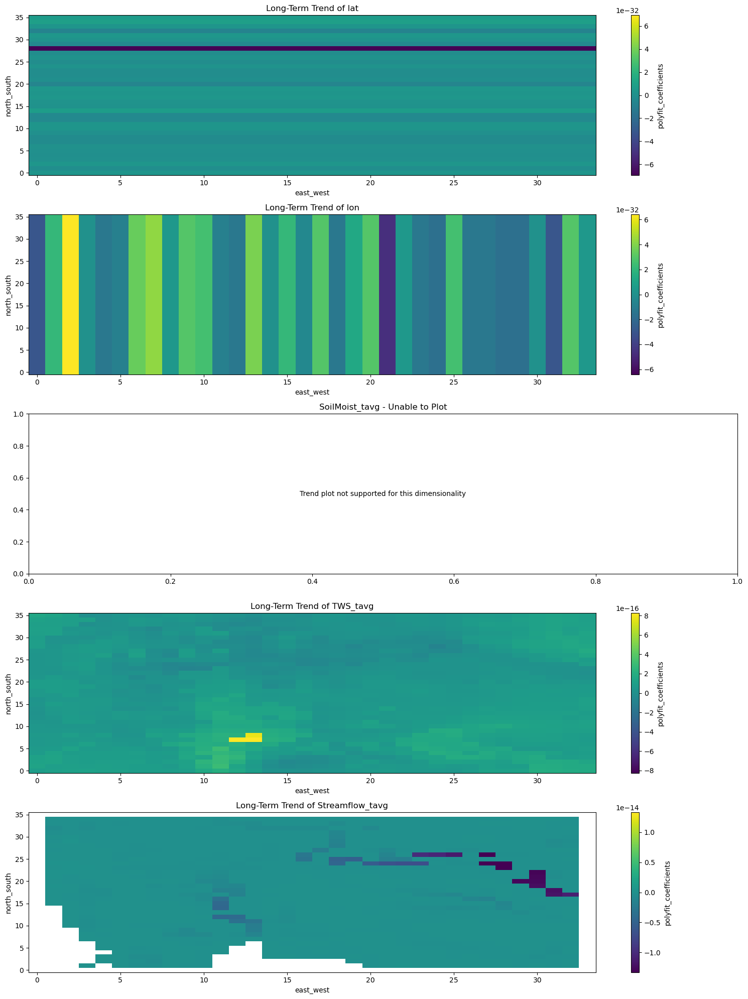

In [106]:
# Set up the figure with subplots
fig, axs = plt.subplots(len(variables_to_plot), 1, figsize=(15, len(variables_to_plot) * 4))

# Plot each variable's trend
for i, var_name in enumerate(variables_to_plot):
    variable = ds_surface[var_name]
    trend_slope = compute_trend(variable)

    # Check dimensionality to plot correctly (2D plot for spatial data)
    if trend_slope.ndim == 2:  # Assuming dimensions are (latitude, longitude)
        trend_slope.plot(ax=axs[i], cmap='viridis')
        axs[i].set_title(f'Long-Term Trend of {var_name}')
    else:
        axs[i].text(0.5, 0.5, 'Trend plot not supported for this dimensionality',
                    horizontalalignment='center', verticalalignment='center')
        axs[i].set_title(f'{var_name} - Unable to Plot')

plt.tight_layout()
plt.show()

In [107]:
combined_soil_moisture.shape

(5113, 36, 34)

In [108]:
# Calculate the long-term average and standard deviation across all time points
long_term_average = combined_soil_moisture.mean(axis=0)  # Shape: (north_south, east_west)
long_term_std = combined_soil_moisture.std(axis=0)  # Shape: (north_south, east_west)

SMDI shape: (365, 36, 34)


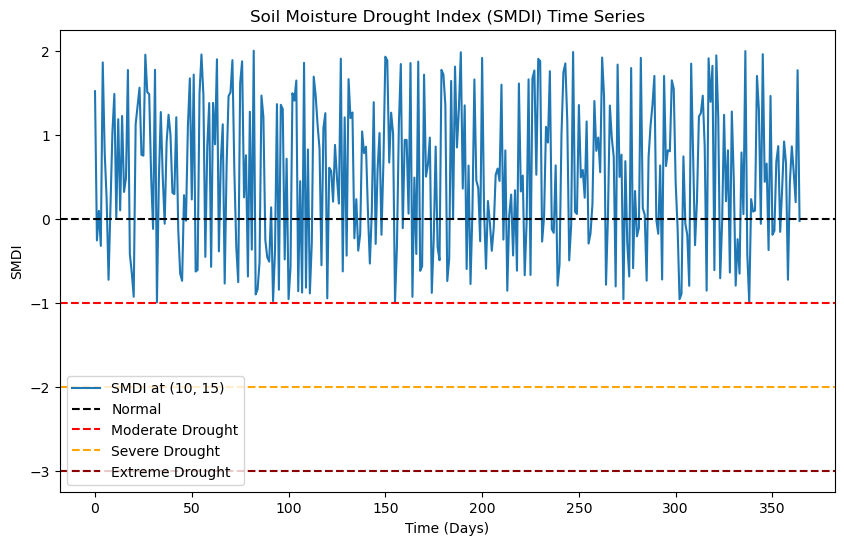

In [109]:
#Soil Moisture Drought Index (SMDI) Calculation:
def calculate_smdi(soil_moisture, long_term_avg):
    """
    Calculate Soil Moisture Drought Index (SMDI) for each grid point in space and time.
    
    Parameters:
    - soil_moisture: 3D array of soil moisture values (time, lat, lon).
    - long_term_avg: 2D array of long-term average soil moisture (lat, lon).
    
    Returns:
    - smdi: 3D array of Soil Moisture Drought Index (time, lat, lon).
    """
    # Ensure long_term_avg has the correct dimensions (lat, lon) and is broadcastable to (time, lat, lon)
    if long_term_avg.ndim == 2:
        long_term_avg = np.expand_dims(long_term_avg, axis=0)  # Add time dimension to long_term_avg
    
    # Calculate SMDI: (soil moisture - long-term average) / long-term average
    smdi = (soil_moisture - long_term_avg) / long_term_avg
    
    return smdi

# Example soil moisture data (time, lat, lon) and long-term average (lat, lon)
soil_moisture_data = np.random.rand(365, 36, 34)  # Daily soil moisture for 1 year over a grid
long_term_avg_sm = np.mean(combined_soil_moisture, axis=0)  # Long-term average over all time steps

# Calculate the SMDI
smdi_values = calculate_smdi(soil_moisture_data, long_term_avg_sm)

# Verify dimensions of the output
print("SMDI shape:", smdi_values.shape)

smdi_values = calculate_smdi(soil_moisture_data, long_term_avg_sm)

import matplotlib.pyplot as plt

# Select a specific grid point (lat, lon)
lat_idx, lon_idx = 10, 15  # Example grid coordinates

# Extract the SMDI time series for the selected grid point
smdi_timeseries = smdi_values[:, lat_idx, lon_idx]

# Plot the SMDI time series
plt.figure(figsize=(10, 6))
plt.plot(smdi_timeseries, label=f'SMDI at ({lat_idx}, {lon_idx})')
plt.axhline(0, color='k', linestyle='--', label='Normal')
plt.axhline(-1, color='r', linestyle='--', label='Moderate Drought')
plt.axhline(-2, color='orange', linestyle='--', label='Severe Drought')
plt.axhline(-3, color='darkred', linestyle='--', label='Extreme Drought')
plt.title('Soil Moisture Drought Index (SMDI) Time Series')
plt.xlabel('Time (Days)')
plt.ylabel('SMDI')
plt.legend()
plt.show()

In [110]:
tws.shape

(5113, 36, 34)

In [111]:
# Example TWS data and long-term average
tws_data = np.random.rand(365, 36, 34)  # Daily TWS for 1 year
long_term_avg_tws = np.mean(tws, axis=0)  # Example of long-term average
print(tws_data.shape)
print(long_term_avg_tws.shape)

(365, 36, 34)
(36, 34)


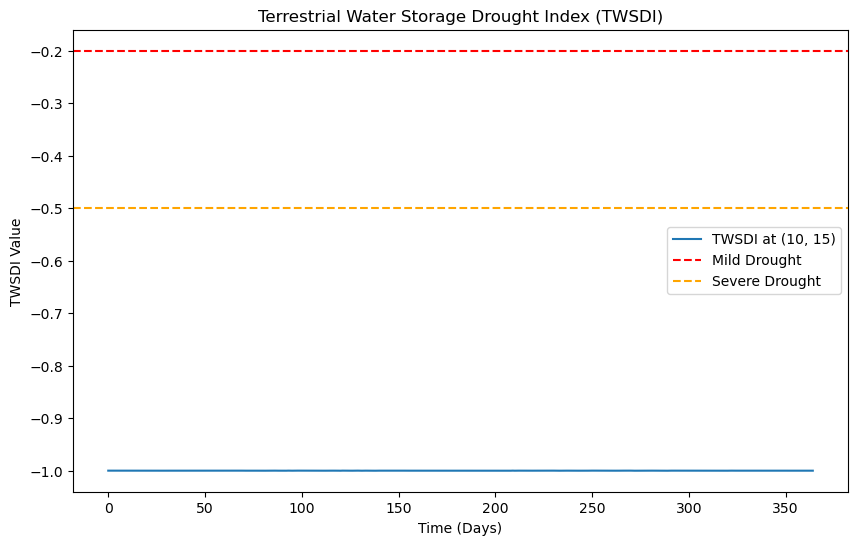

In [112]:
def calculate_twsdi(tws_data, long_term_avg_tws):
    """
    Calculate the Terrestrial Water Storage Drought Index (TWSDI)
    over time and space.
    
    Parameters:
    tws_data : 3D array (time, lat, lon)
        The Terrestrial Water Storage data.
    long_term_avg_tws : 2D array (lat, lon)
        The long-term average TWS for each grid point.
    
    Returns:
    twsdi_values : 3D array (time, lat, lon)
        The TWSDI values for each time step and grid point.
    """
    # Ensure the input data dimensions match
    assert tws_data.shape[1:] == long_term_avg_tws.shape, "Dimension mismatch between TWS data and long-term average."

    # Initialize an array to hold TWSDI values
    twsdi_values = np.empty(tws_data.shape)

    # Loop through each time step
    for t in range(tws_data.shape[0]):
        # Compute the TWSDI at each grid point (lat, lon) for the current time step
        twsdi_values[t] = (tws_data[t] - long_term_avg_tws) / long_term_avg_tws

    return twsdi_values

twsdi_values = calculate_twsdi(tws_data, long_term_avg_tws)


import matplotlib.pyplot as plt

# Select a specific grid point (lat, lon)
lat_idx, lon_idx = 10, 15  # Example grid coordinates

# Extract the SMDI time series for the selected grid point
twsdi_timeseries = twsdi_values[:, lat_idx, lon_idx]

# Plot the TWSDI time series
plt.figure(figsize=(10, 6))
plt.plot(twsdi_timeseries, label=f'TWSDI at ({lat_idx}, {lon_idx})')
plt.axhline(-0.2, color='r', linestyle='--', label='Mild Drought')
plt.axhline(-0.5, color='orange', linestyle='--', label='Severe Drought')
plt.title('Terrestrial Water Storage Drought Index (TWSDI)')
plt.xlabel('Time (Days)')
plt.ylabel('TWSDI Value')
plt.legend()
plt.show()

In [113]:
# Ensure latitude and longitude are 2D arrays
latitude_2D = ds_surface['lat'].values[0, :, :]  # Shape: (north_south, east_west)
longitude_2D = ds_surface['lon'].values[0, :, :]  # Shape: (north_south, east_west)